In [30]:
import sys
sys.path.append("/scratch/group/csce435-f24/python-3.10.4/lib/python3.10/site-packages")
sys.path.append("/scratch/group/csce435-f24/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read all files

In [31]:
#1_trial is a name of a folder containing the cali files, you may create a folder with a different name and replace the folder name here
tk = th.Thicket.from_caliperreader(glob("*.cali"))

(2/2) Creating Thicket: 100%|██████████| 279/279 [00:10<00:00, 27.49it/s]


View Calltree

In [32]:
print(tk.tree(metric_column="Min time/rank"))

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2024.1.0

1.151 main
└─ 1.146 main
   ├─ 0.499 comm
   │  ├─ 0.033 MPI_Barrier
   │  ├─ 0.000 MPI_Comm_dup
   │  ├─ 0.000 MPI_Finalize
   │  ├─ 0.000 MPI_Finalized
   │  ├─ 0.000 MPI_Init
   │  └─ 0.000 MPI_Initialized
   ├─ 0.600 comp_large
   │  ├─ 0.092 comm
   │  │  └─ 0.091 comm_large
   │  │     ├─ 0.052 MPI_Recv
   │  │     └─ 0.000 MPI_Send
   │  └─ 0.447 comp_large
   ├─ 0.003 correctness_check
   └─ 0.004 data_init_runtime

Legend (Metric: Min time/rank Min: 0.00 Max: 1.15 indices: {'profile': 5360418})
█ 1.04 - 1.15
█ 0.81 - 1.04
█ 0.58 - 0.81
█ 0.35 - 0.58
█ 0.12 - 0.35
█ 0.00 - 0.12

name User code    ◀  Only in left graph    ▶  Only in right graph



Group Performance data by `matrix_size` in the Thicket metadata table.

In [33]:
tk.metadata_column_to_perfdata("num_procs")
tk.metadata_column_to_perfdata("input_size")
tk.metadata_column_to_perfdata("input_type")

tk.dataframe = tk.dataframe.reset_index().set_index(["node", "num_procs", "input_size", "input_type"]).sort_index()

In [34]:
processes = [2,4,8,16,32,64,128,256,512,1024]

In [35]:
# Change font size for all plots
plt.rcParams.update({"font.size": 20})

In [36]:
def plot_pandas(df, title, xlabel, ylabel):
    plot = df.plot(kind="line", 
        marker='o', 
        title=title, 
        xlabel=xlabel,
        ylabel=ylabel, 
        figsize=(15,7)
            
    )
    plot.set_xticks(processes)
    plot.set_xticklabels(processes)
    return plot

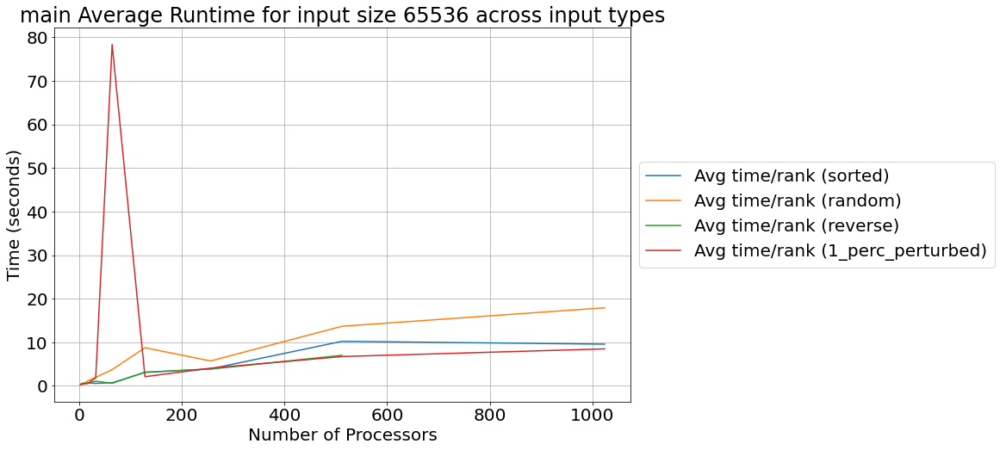

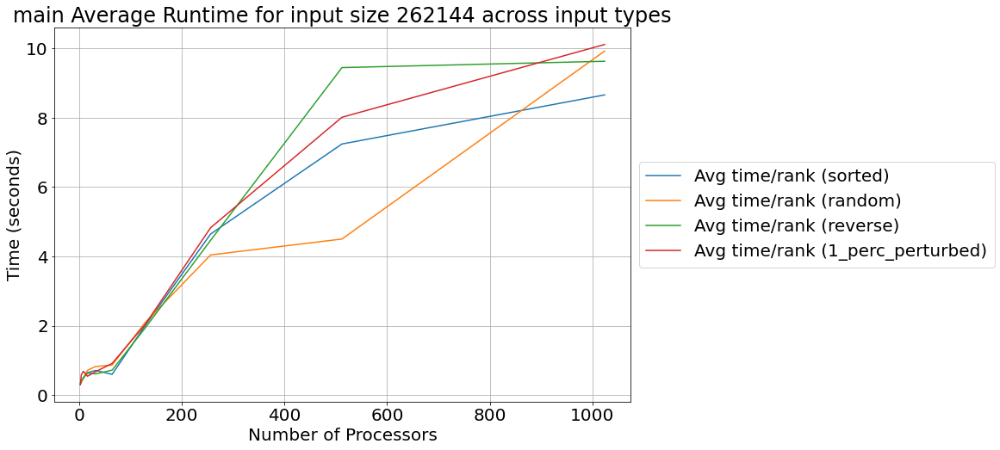

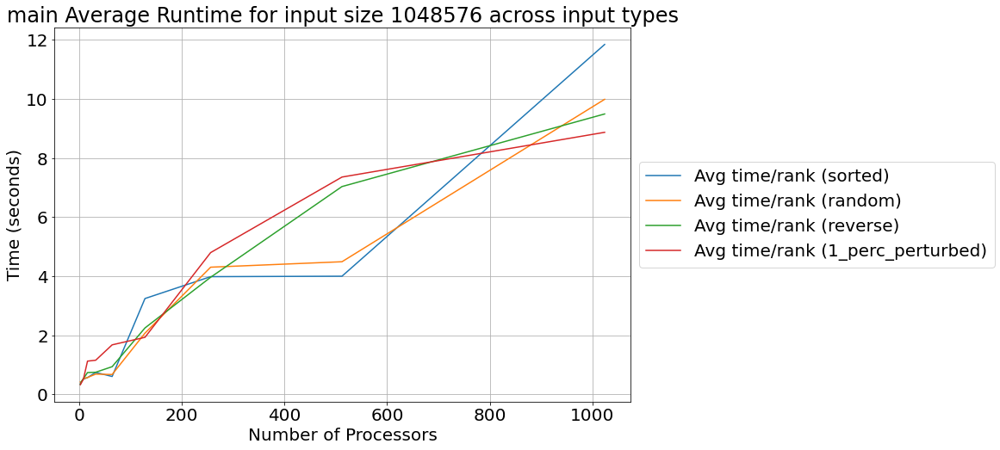

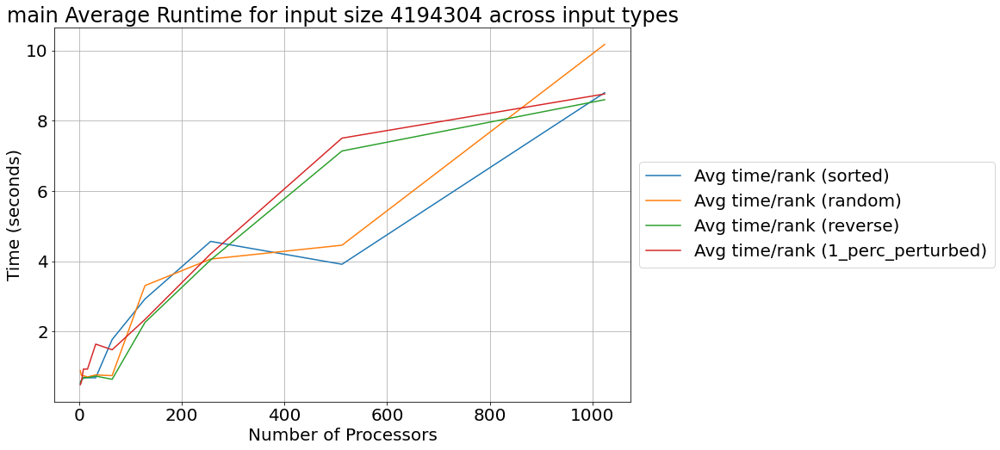

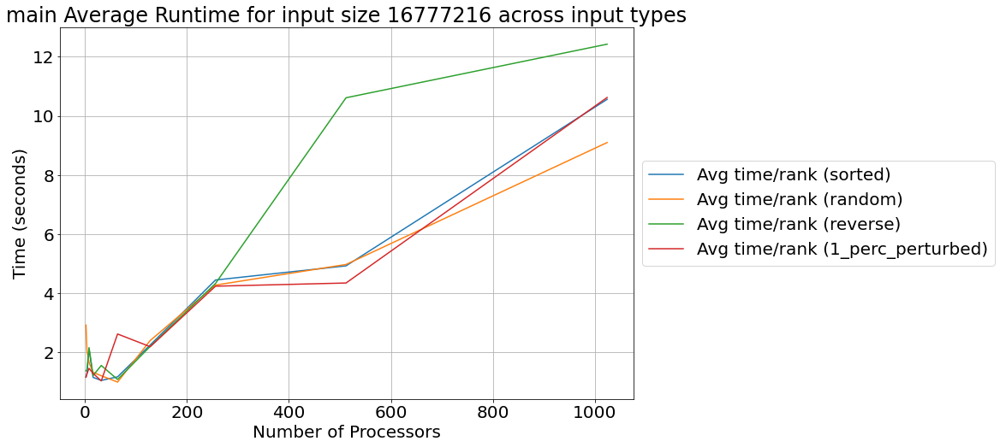

...

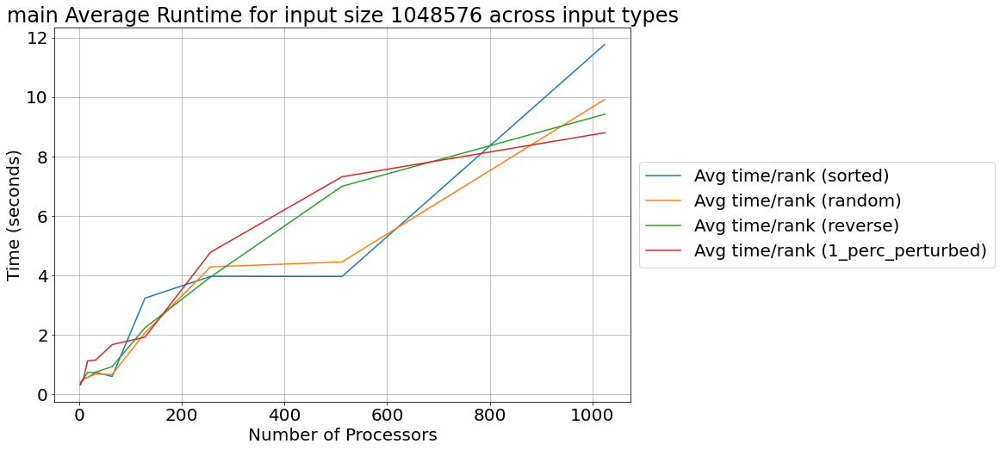

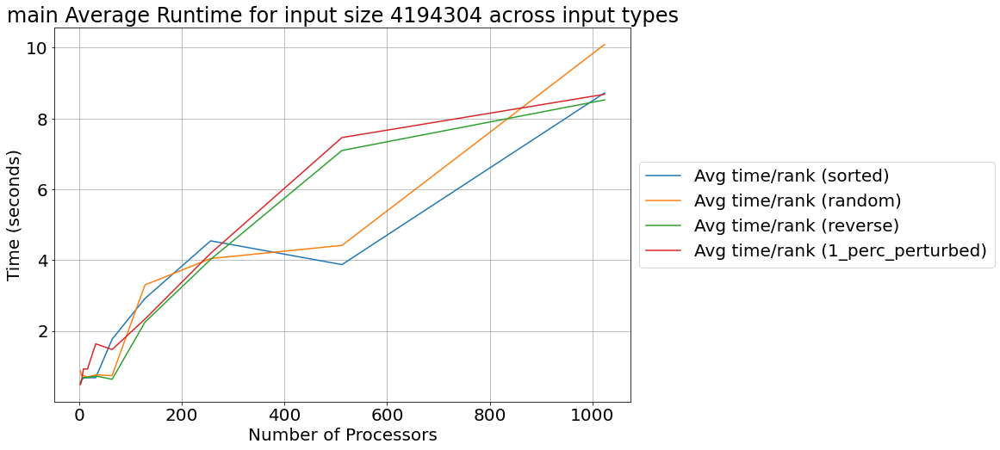

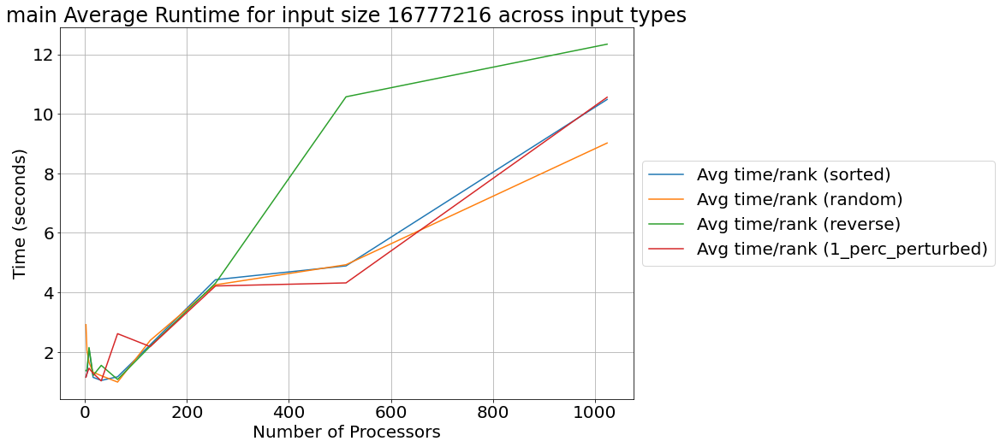

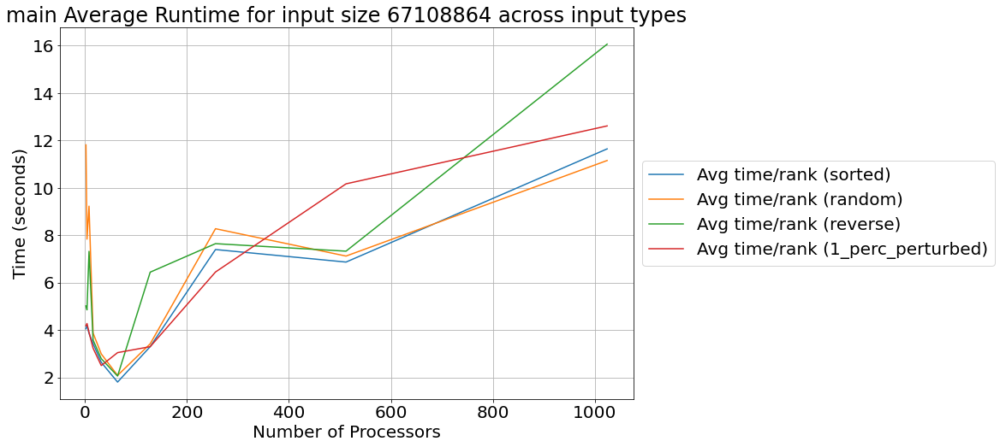

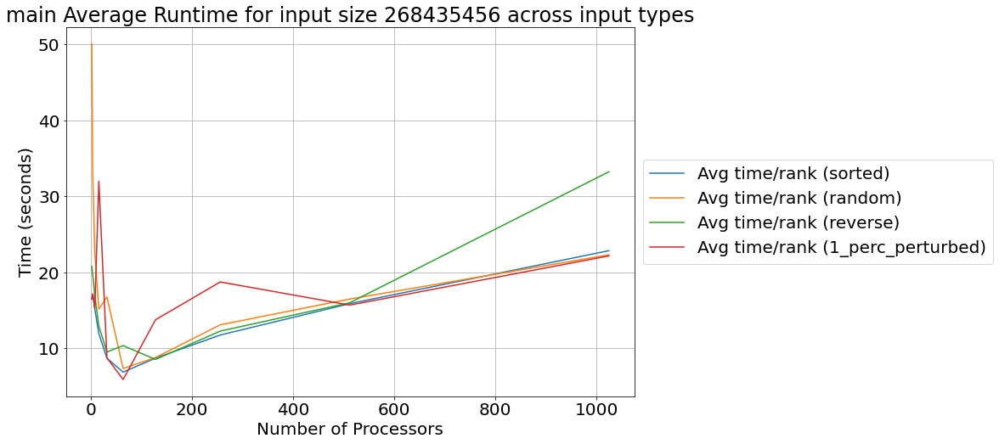

In [37]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
count = 0
for node in tk.graph.traverse():
    if (node.frame["name"] == "main"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'main'
            )
        ]
        
        midpoint = len(wc_df) // 2
        if(count == 0):
            wc_df = wc_df.iloc[0:midpoint]
        else:
            wc_df = wc_df.iloc[midpoint:]
        
        count += 1
        for input_size in input_sizes:
            plt.figure(figsize=(12, 8))

            for input_type in input_types:
                if (input_size == 65536 and input_type == "1_perc_perturbed"):
                    main_df = wc_df.xs(input_size, level='input_size').xs("perturbed", level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')
                
                    # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')
                else:
                    # Extract data for the input type and input size
                    main_df = wc_df.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                        # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')

            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'main Average Runtime for input size {input_size} across input types')
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'main_function_runtime_{input_size}.png', transparent=False, facecolor='white')
            plt.show()

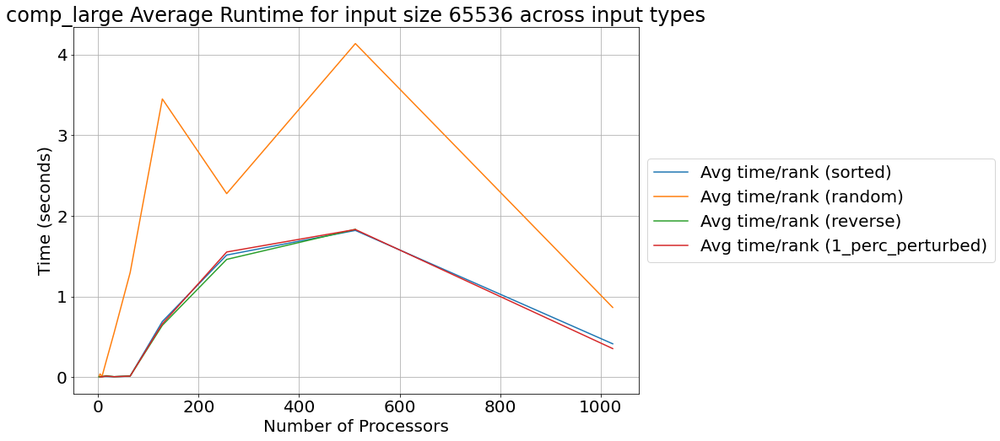

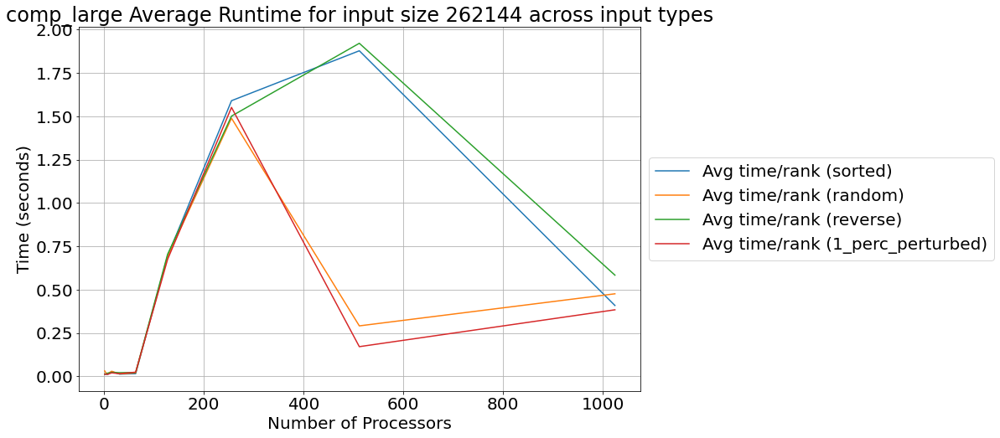

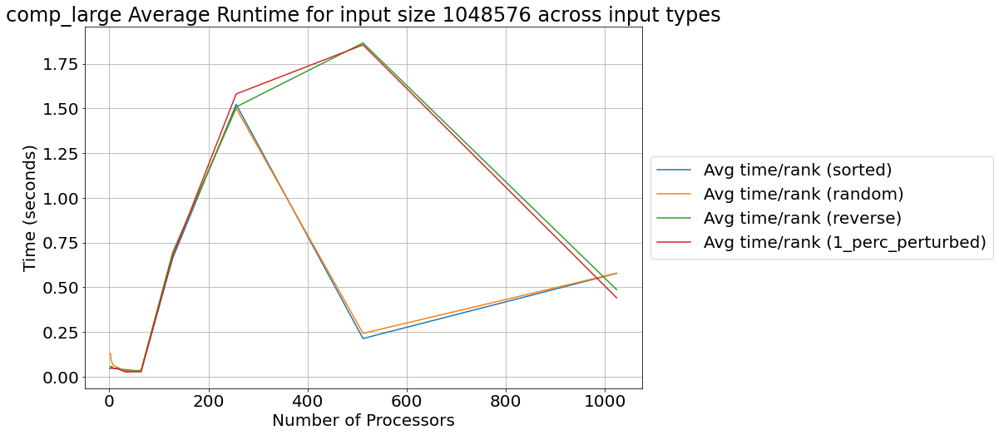

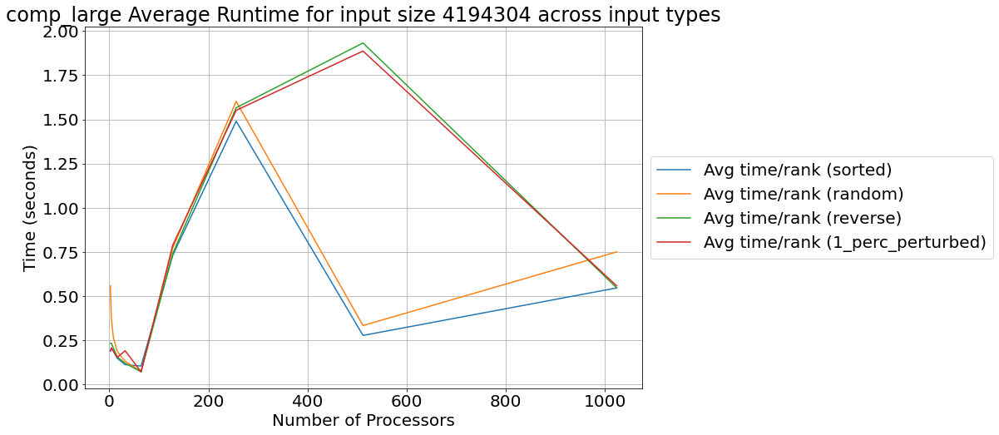

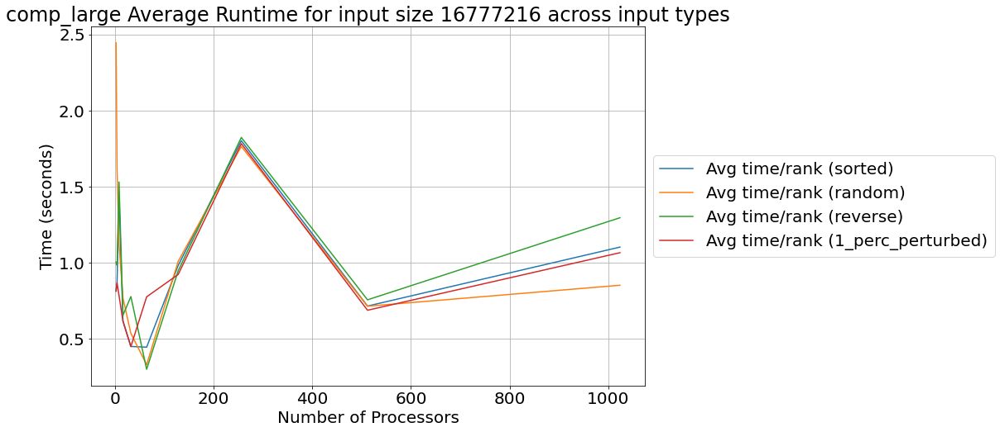

...

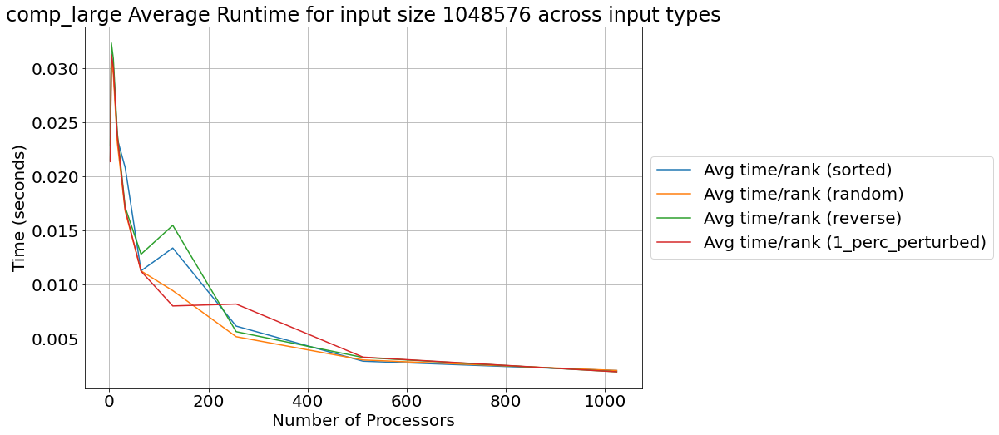

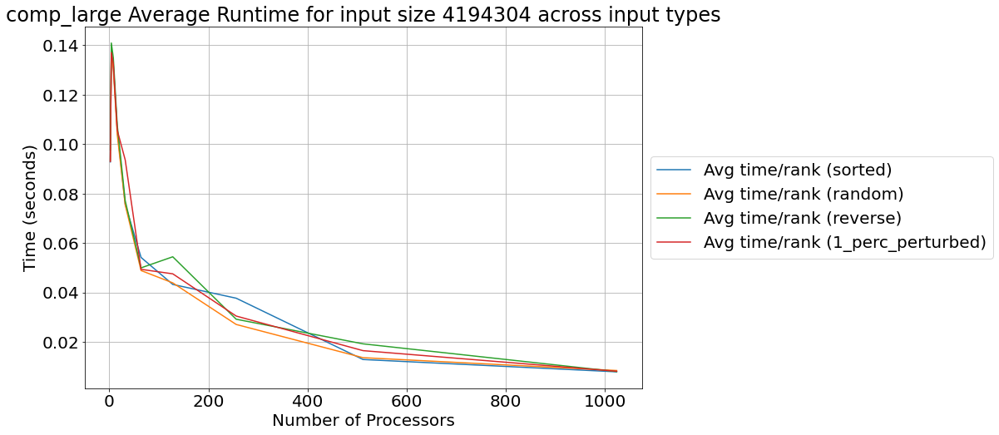

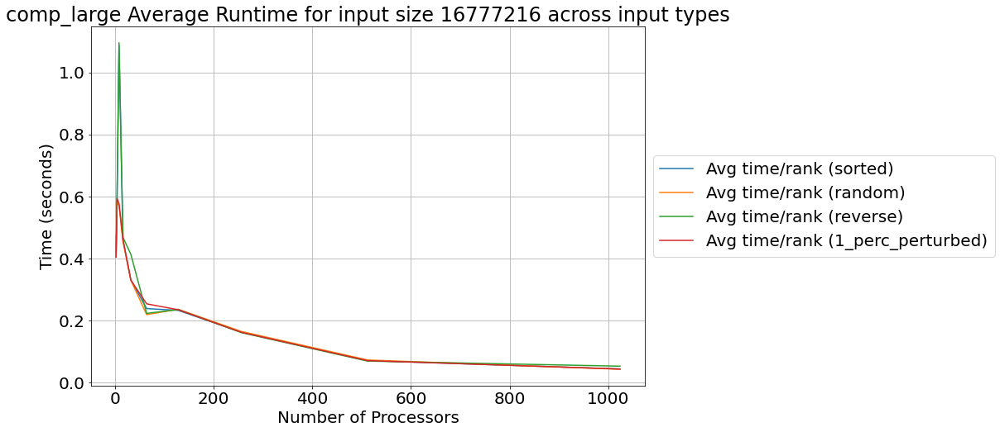

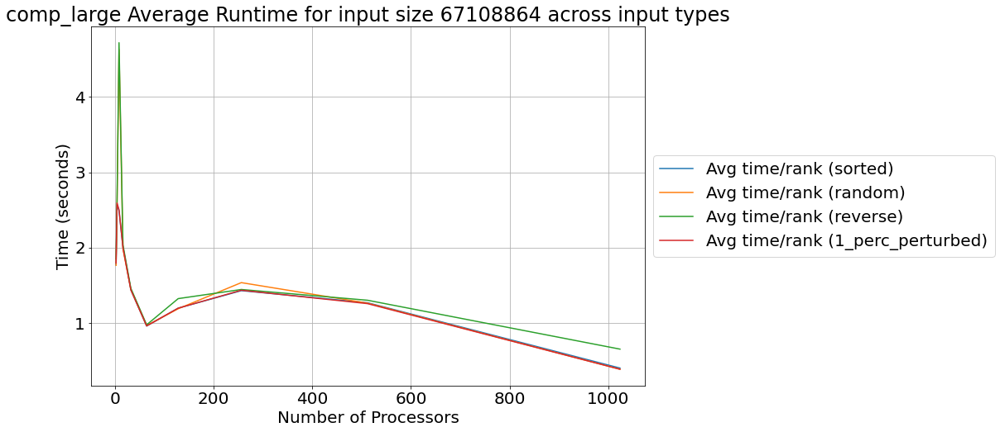

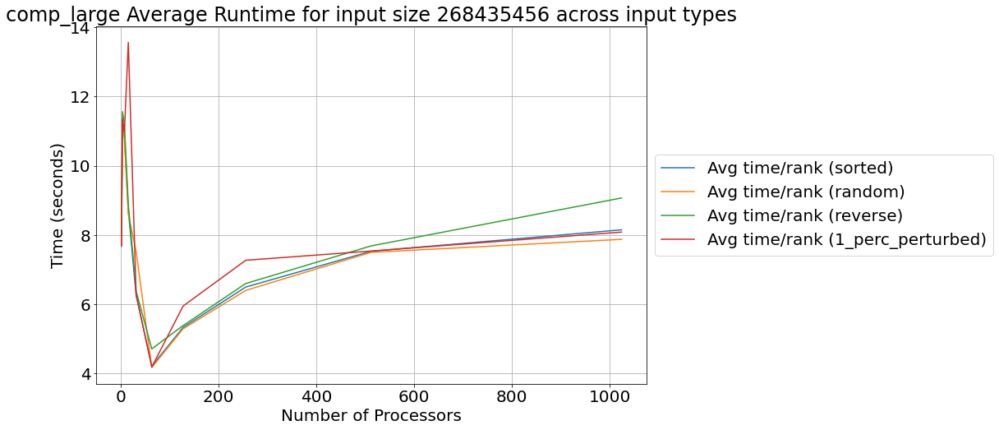

In [38]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
count = 0
for node in tk.graph.traverse():
    if (node.frame["name"] == "comp_large"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comp_large'
            )
        ]
        
        midpoint = len(wc_df) // 2
        if(count == 0):
            wc_df = wc_df.iloc[0:midpoint]
        else:
            wc_df = wc_df.iloc[midpoint:]
        
        count += 1
        for input_size in input_sizes:
            plt.figure(figsize=(12, 8))

            for input_type in input_types:
                if (input_size == 65536 and input_type == "1_perc_perturbed"):
                    main_df = wc_df.xs(input_size, level='input_size').xs("perturbed", level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')
                
                    # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')
                else:
                    # Extract data for the input type and input size
                    main_df = wc_df.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                        # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')

            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'comp_large Average Runtime for input size {input_size} across input types')
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'comp_large_function_runtime_{input_size}.png', transparent=False, facecolor='white')
            plt.show()

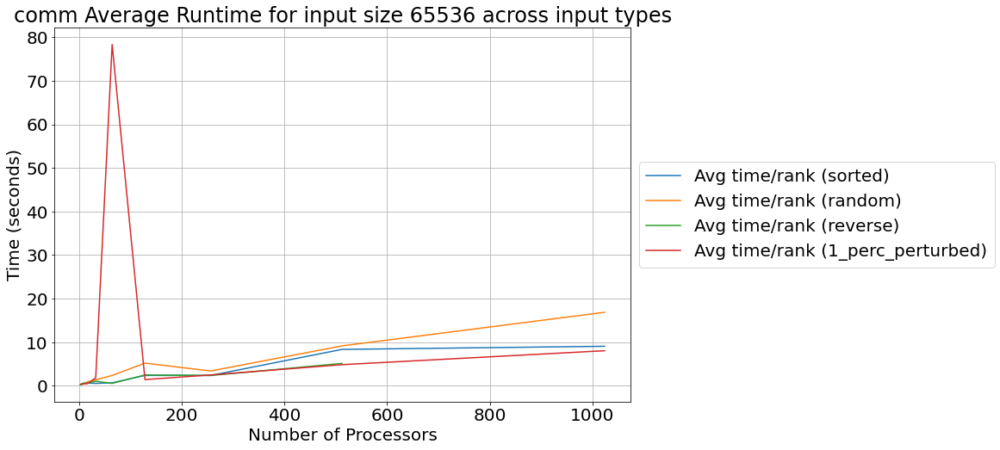

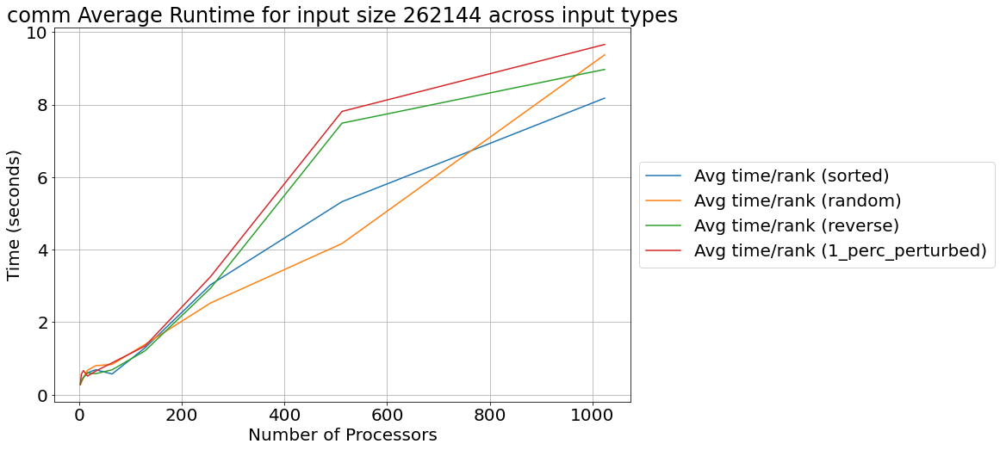

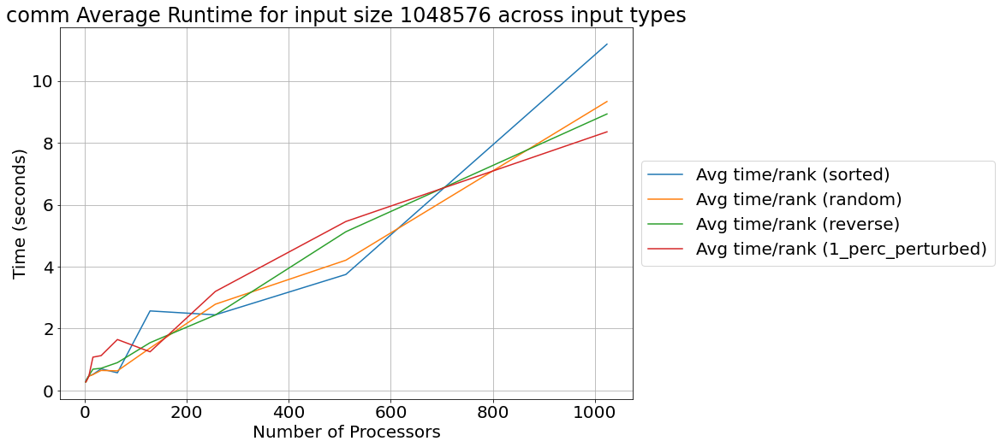

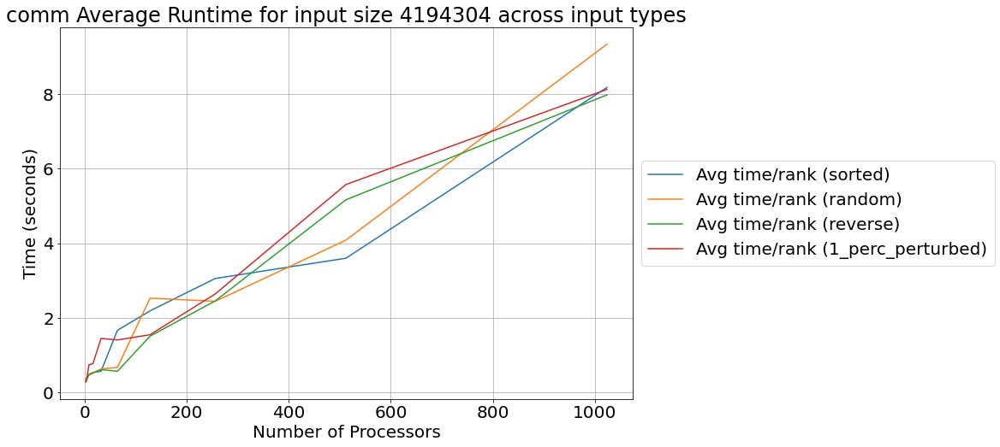

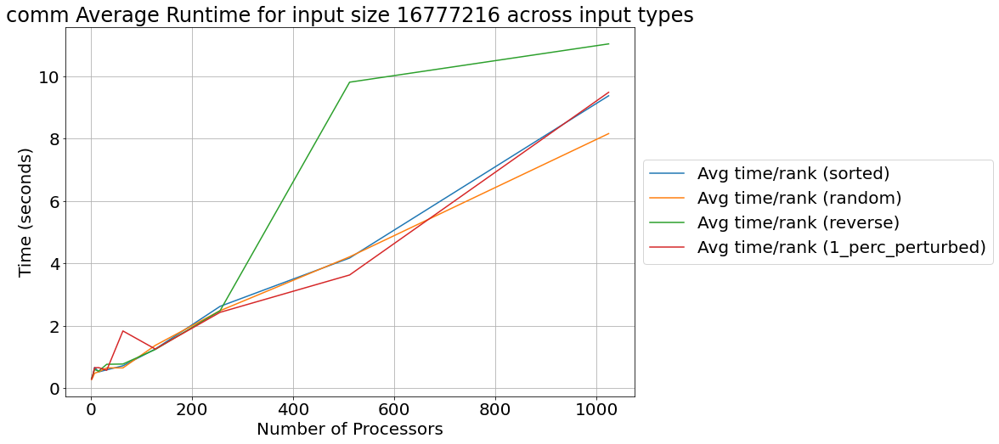

...

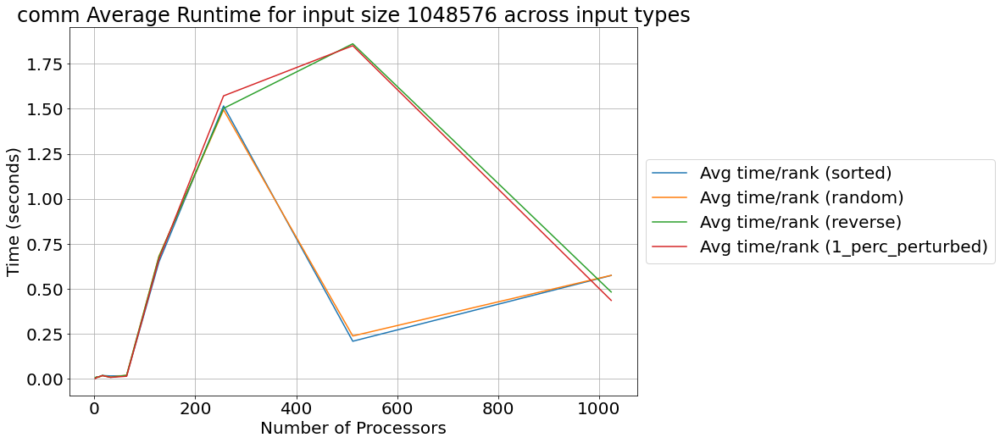

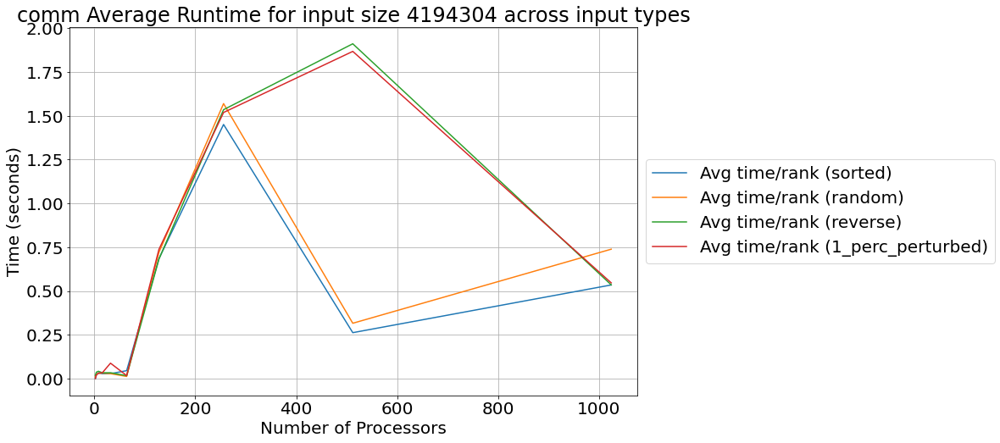

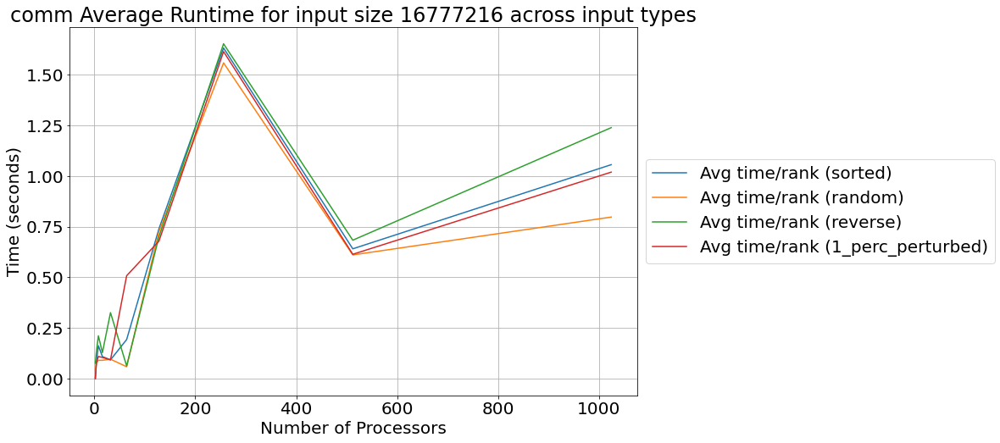

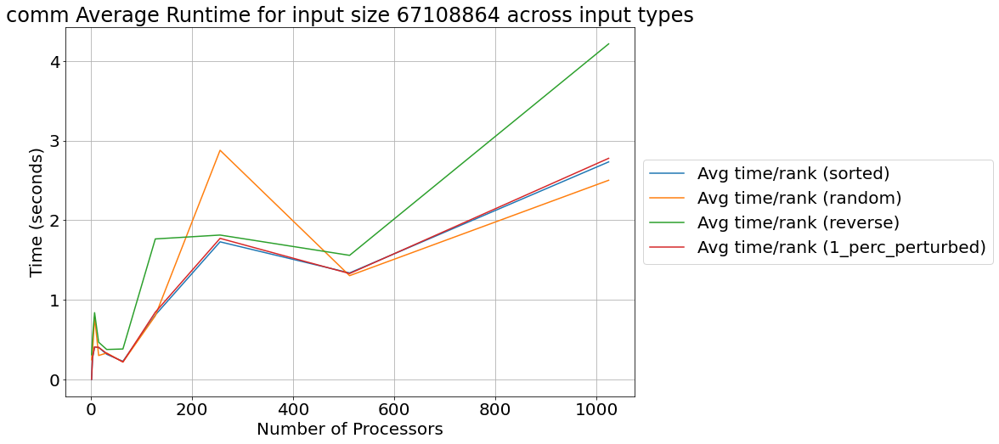

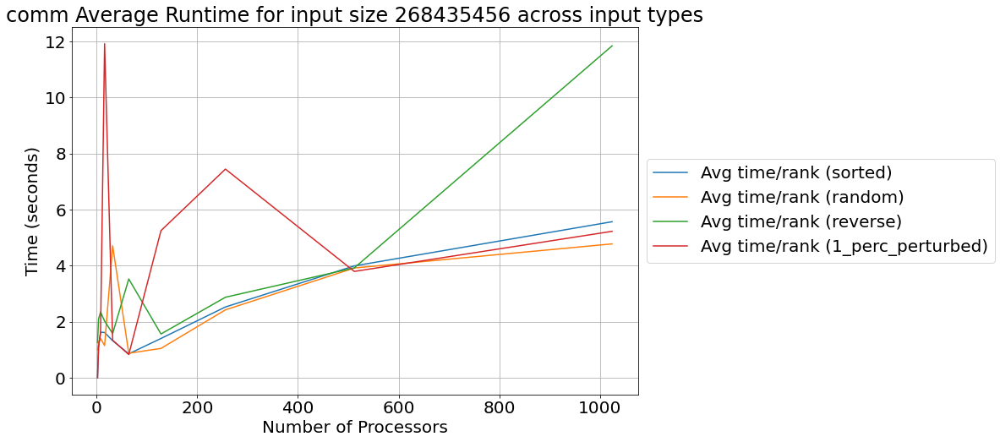

In [39]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
count = 0
for node in tk.graph.traverse():
    if (node.frame["name"] == "comm"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comm'
            )
        ]
        
        midpoint = len(wc_df) // 2
        if(count == 0):
            wc_df = wc_df.iloc[0:midpoint]
        else:
            wc_df = wc_df.iloc[midpoint:]
        
        count += 1
        for input_size in input_sizes:
            plt.figure(figsize=(12, 8))

            for input_type in input_types:
                if (input_size == 65536 and input_type == "1_perc_perturbed"):
                    main_df = wc_df.xs(input_size, level='input_size').xs("perturbed", level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')
                
                    # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')
                else:
                    # Extract data for the input type and input size
                    main_df = wc_df.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    main_avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                        # Plot the average time for main function
                    plt.plot(main_avg_df.index, main_avg_df['Avg time/rank'], label=f'Avg time/rank ({input_type})', linestyle='-')

            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'comm Average Runtime for input size {input_size} across input types')
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'comm_function_runtime_{input_size}.png', transparent=False, facecolor='white')
            plt.show()

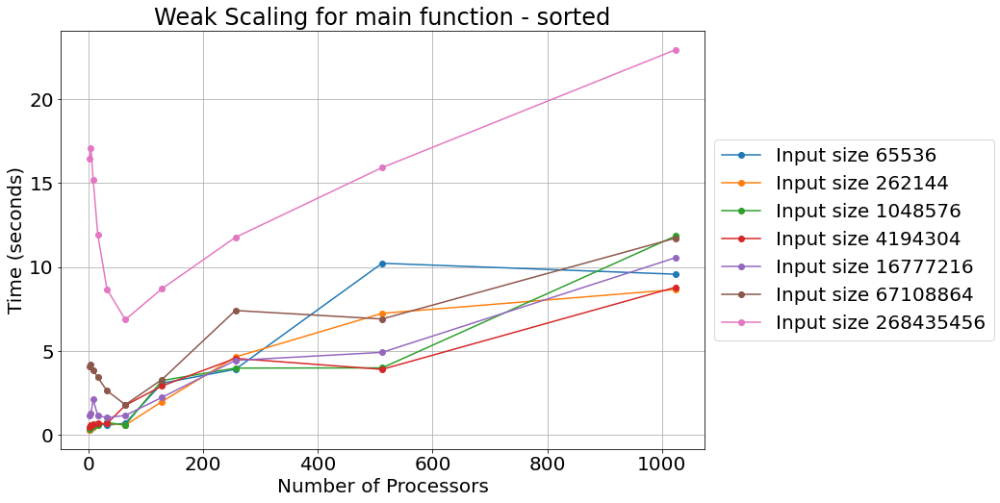

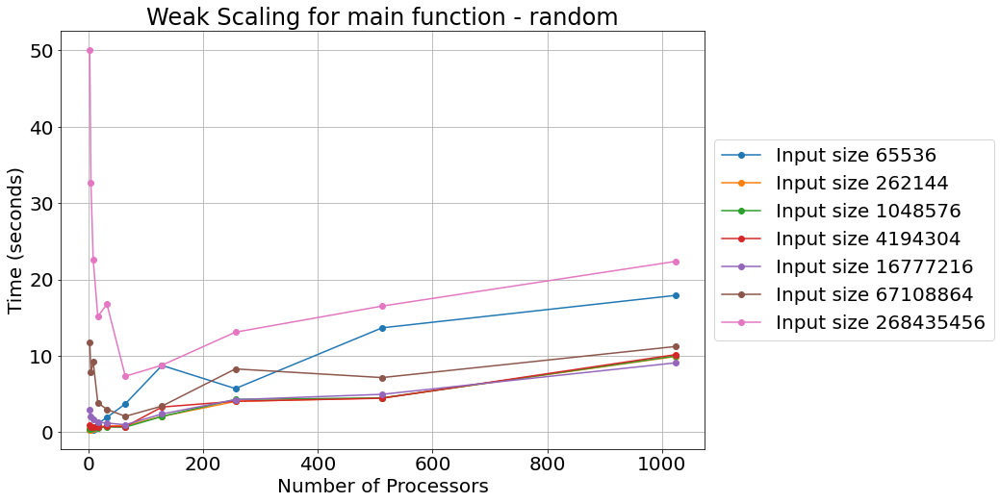

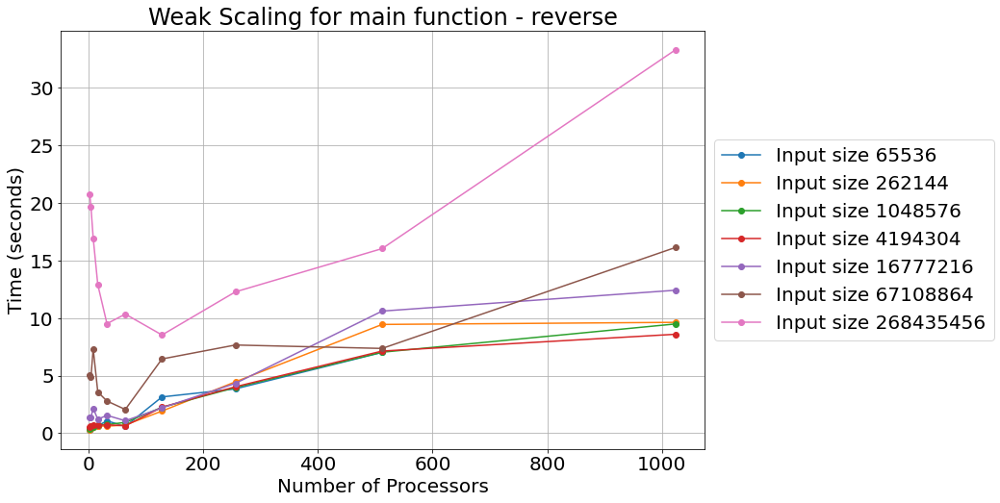

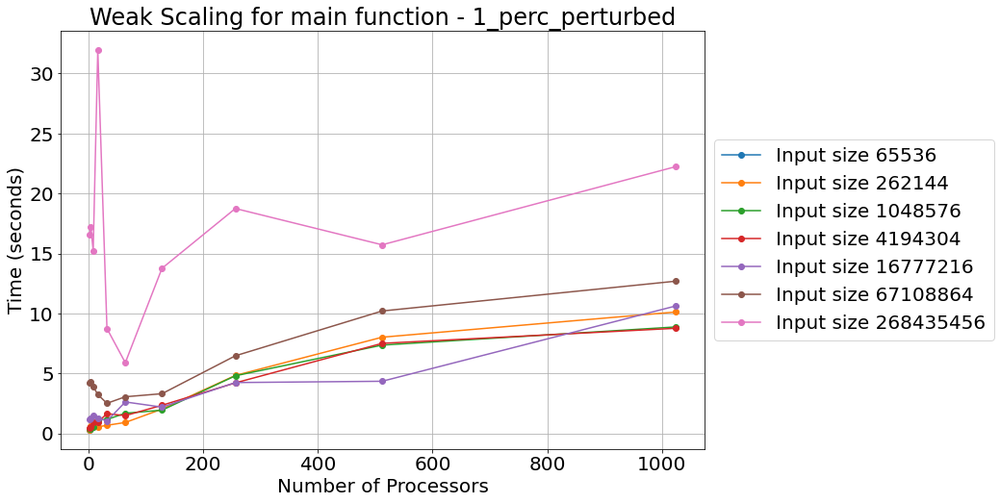

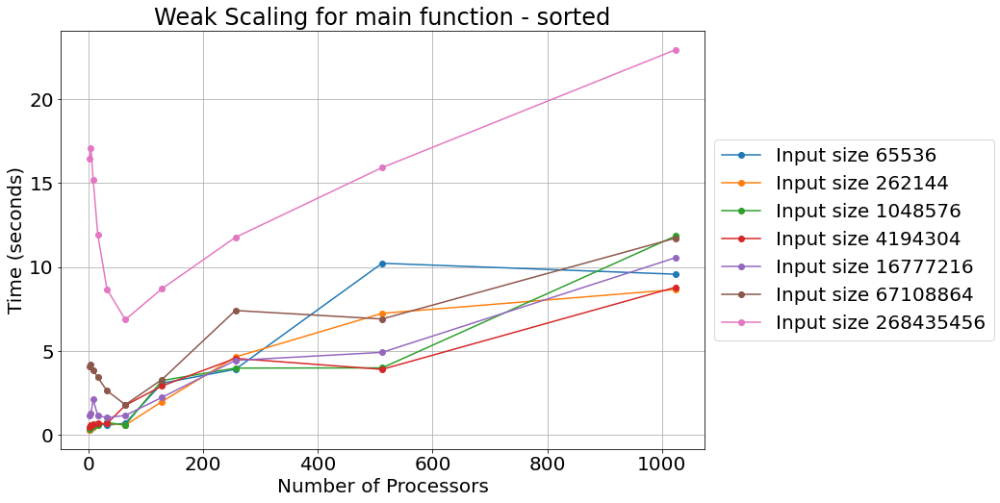

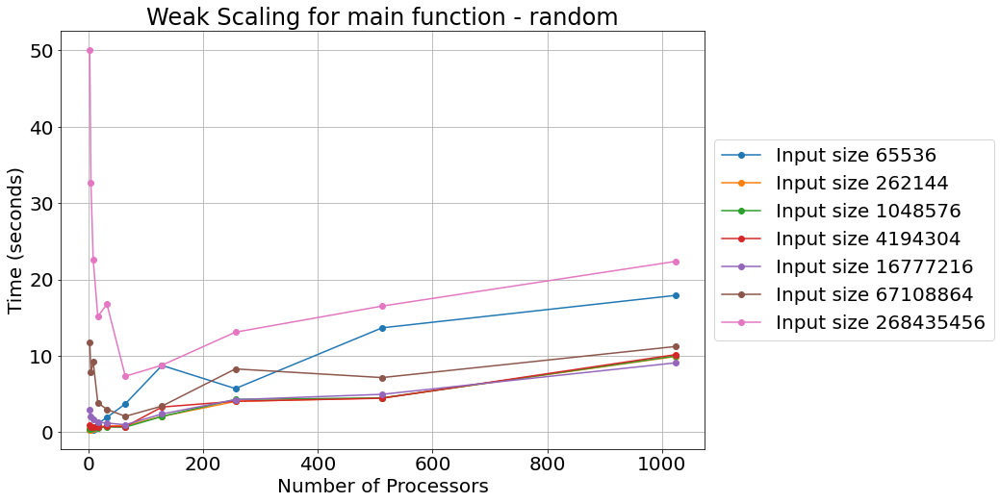

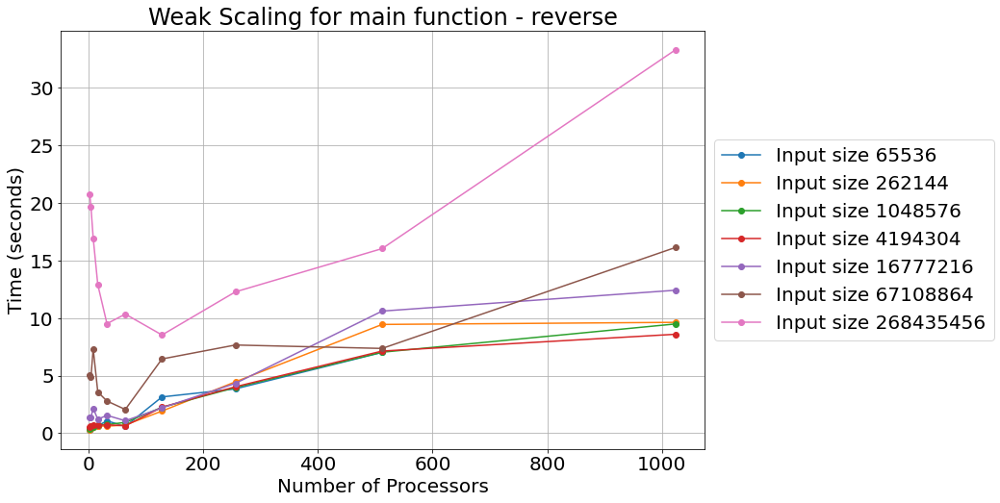

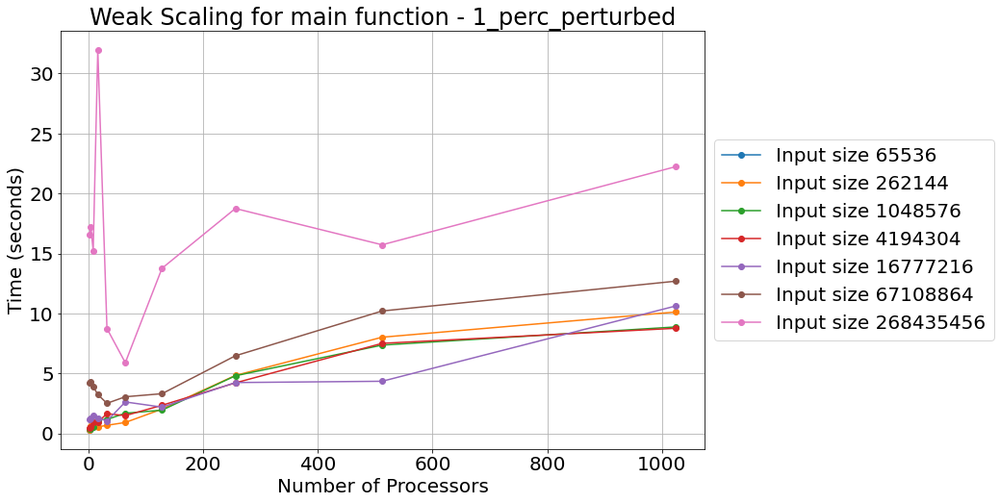

In [40]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']

count = 0
for node in tk.graph.traverse():
    if (node.frame["name"] == "main"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'main'
            )
        ]
                
        count += 1
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'Weak Scaling for main function - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type and input size
                    main_df = tk.dataframe.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                    # Plot the average time for the main function for each input size
                    plt.plot(avg_df.index, avg_df['Avg time/rank'], marker='o', label=f'Input size {input_size}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'weak_scaling_main_{input_type}.png', transparent=False, facecolor='white')
            plt.show()

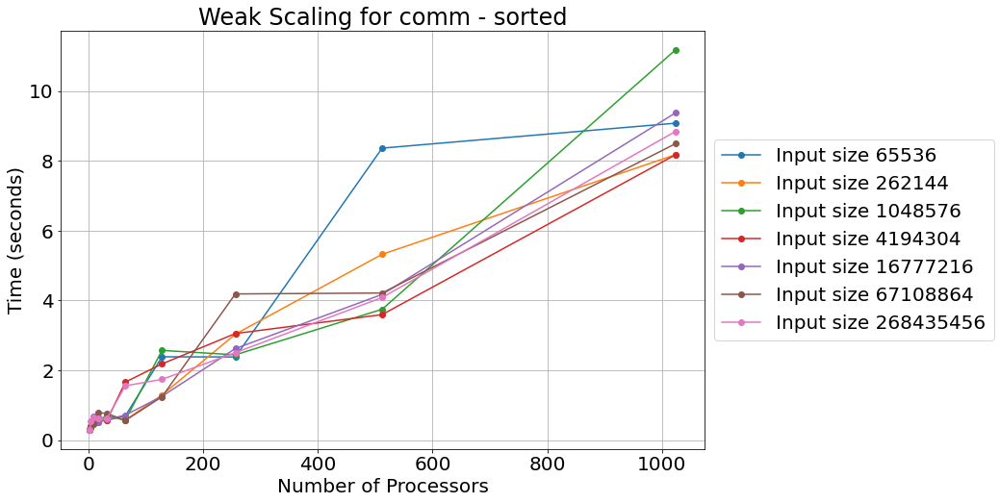

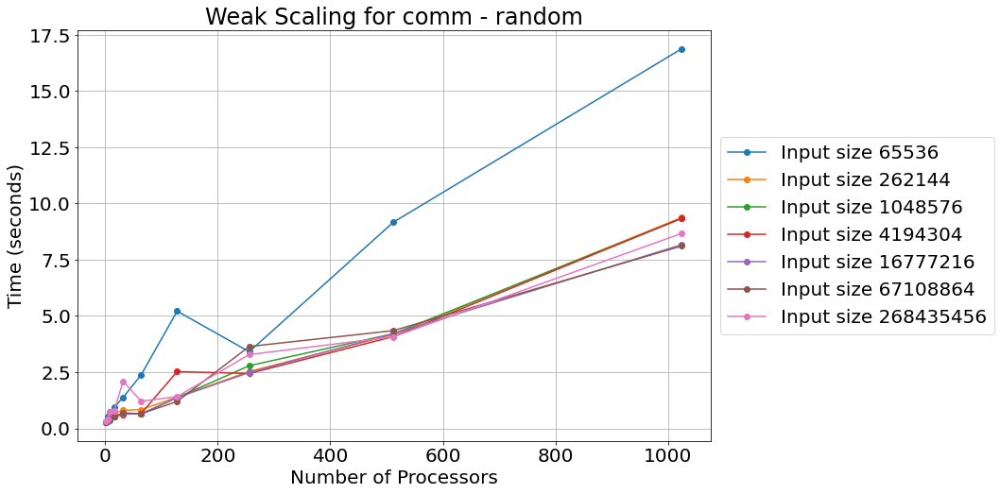

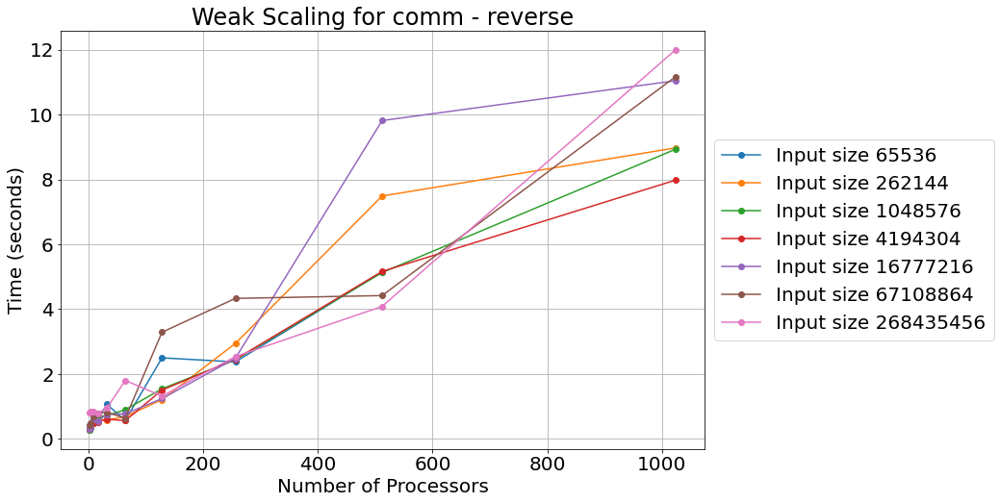

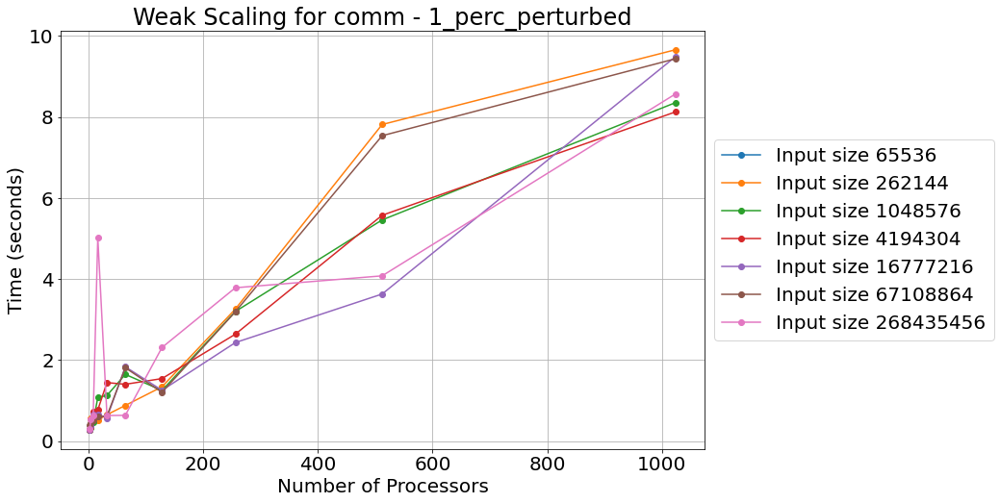

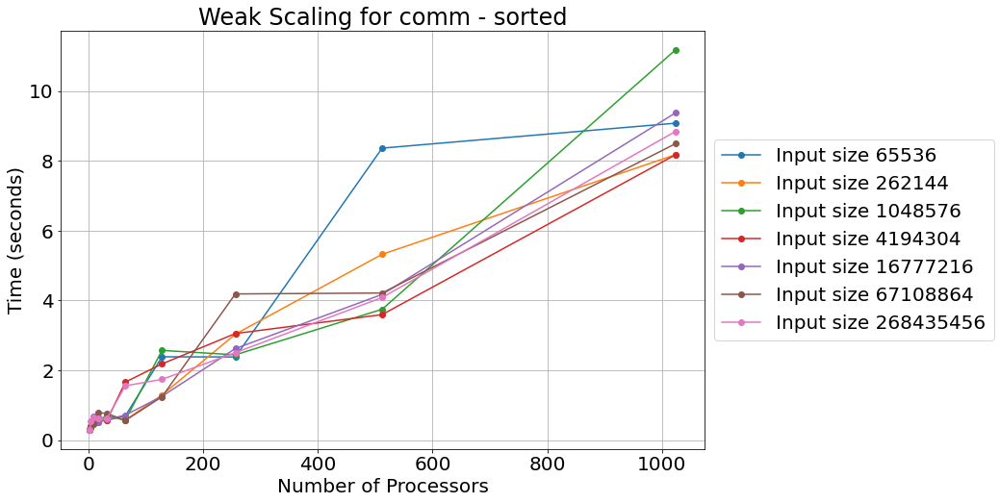

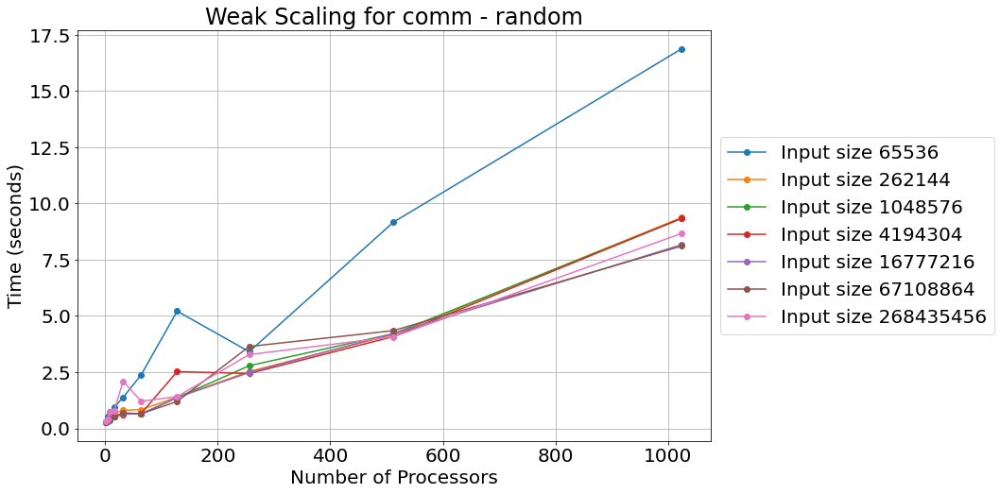

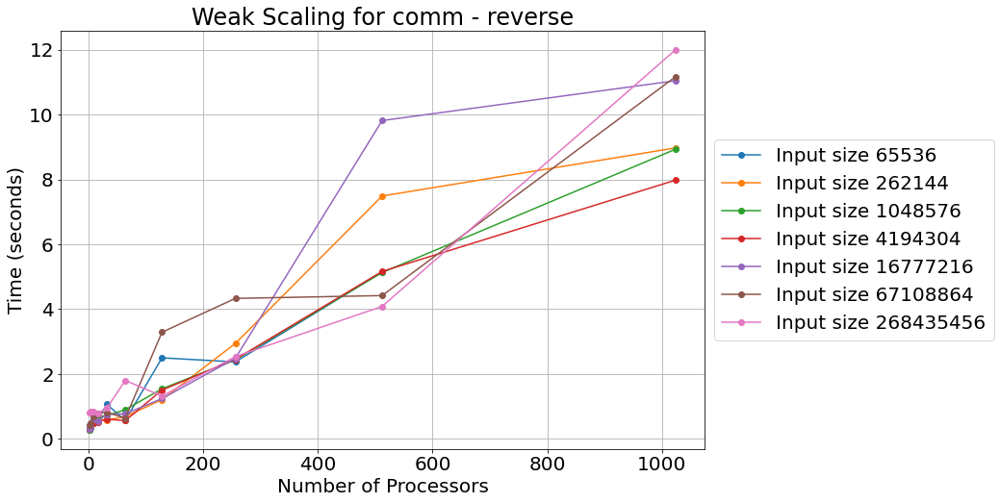

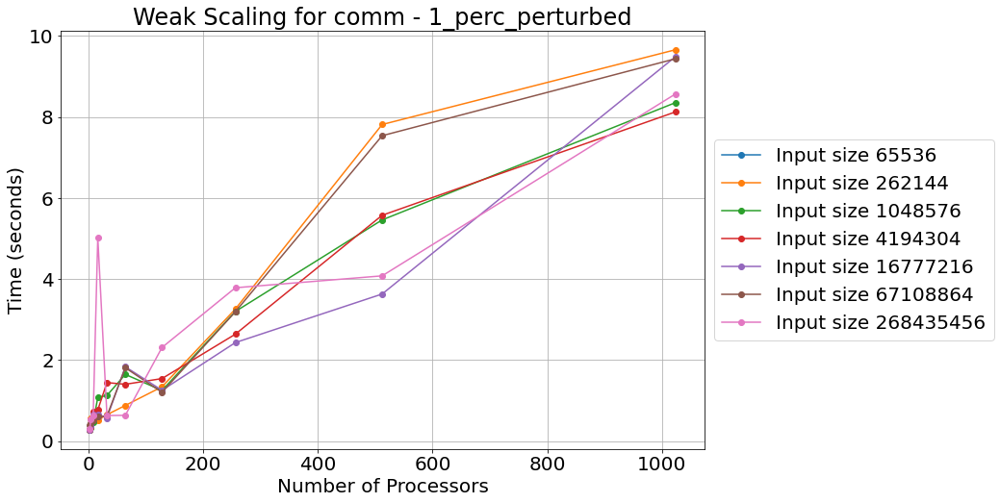

In [41]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']

count = 0
for node in tk.graph.traverse():
    if (node.frame["name"] == "comm"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comm'
            )
        ]
        
        count += 1
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'Weak Scaling for comm - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type and input size
                    main_df = wc_df.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')
                    # Plot the average time for the main function for each input size
                    plt.plot(avg_df.index, avg_df['Avg time/rank'], marker='o', label=f'Input size {input_size}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'weak_scaling_comm_{input_type}.png', transparent=False, facecolor='white')
            plt.show()

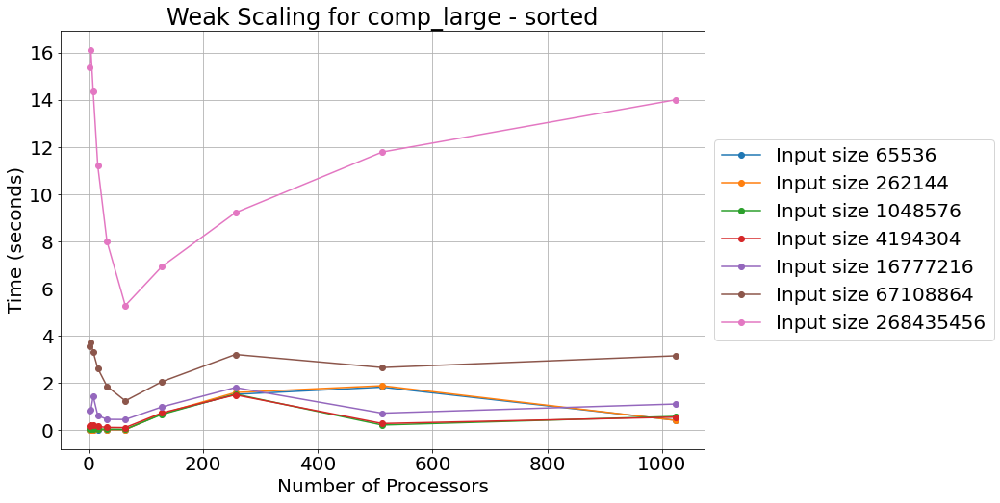

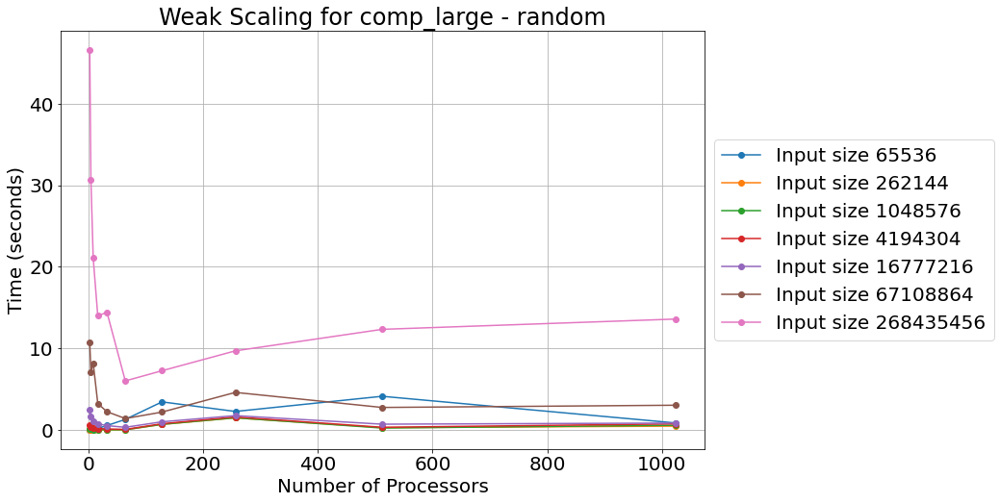

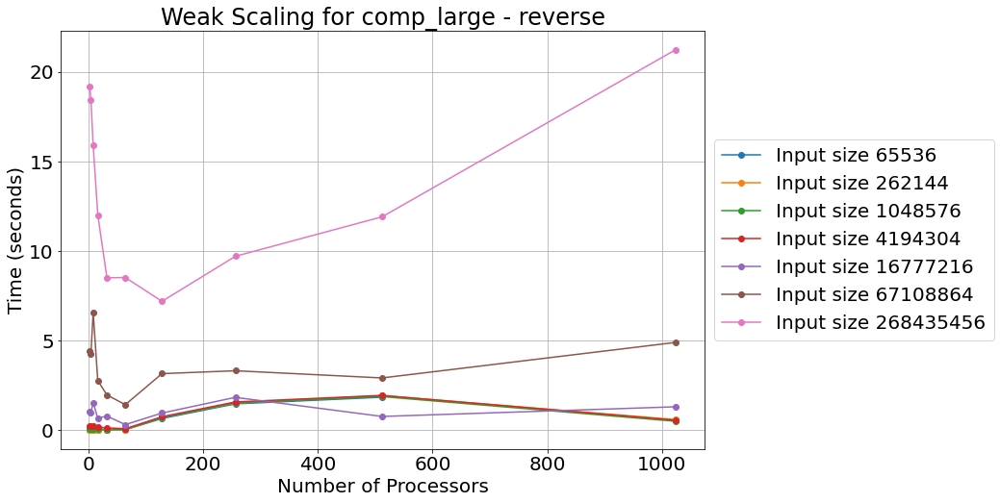

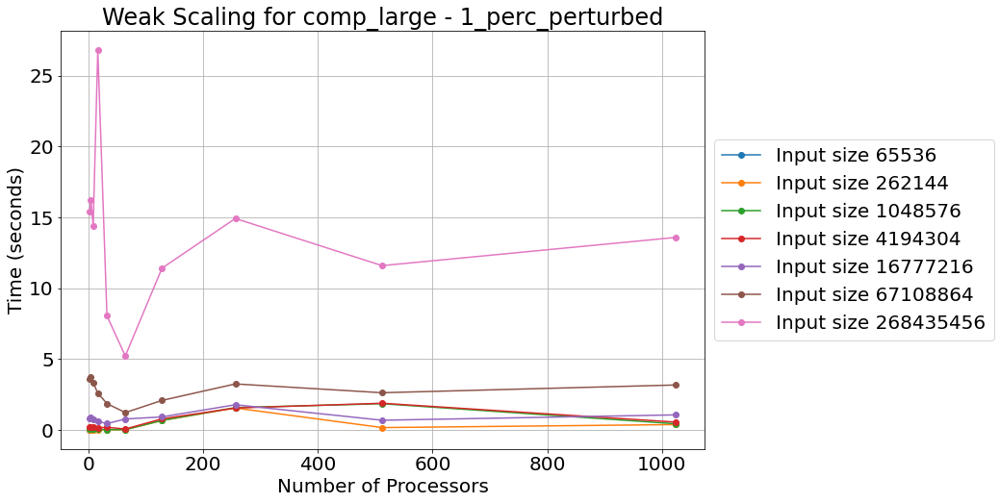

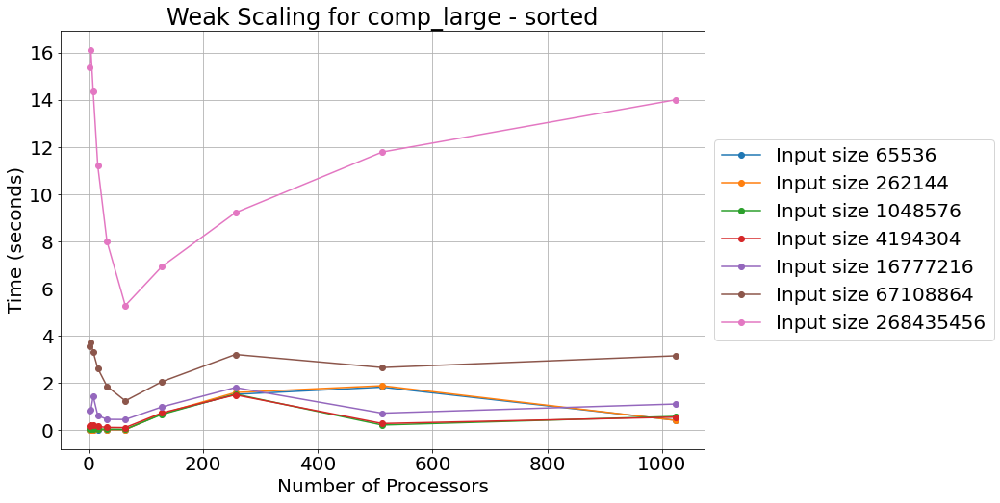

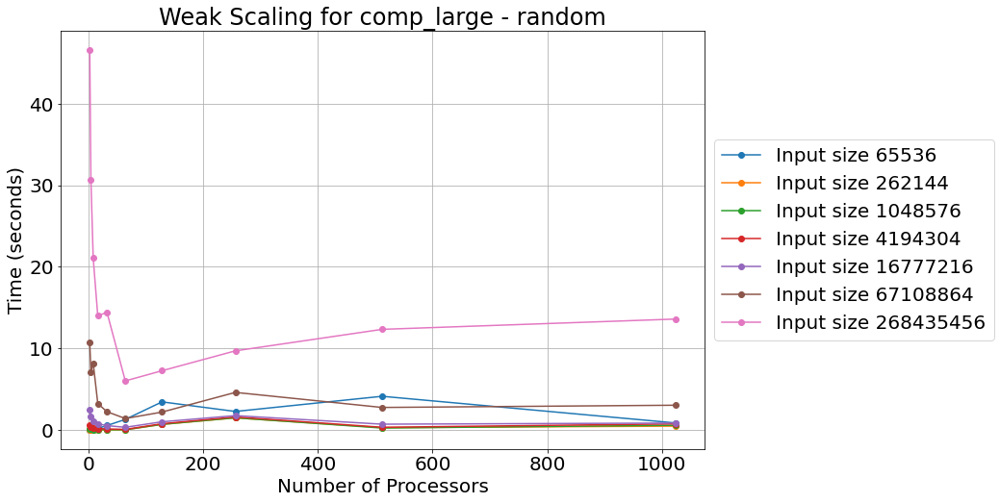

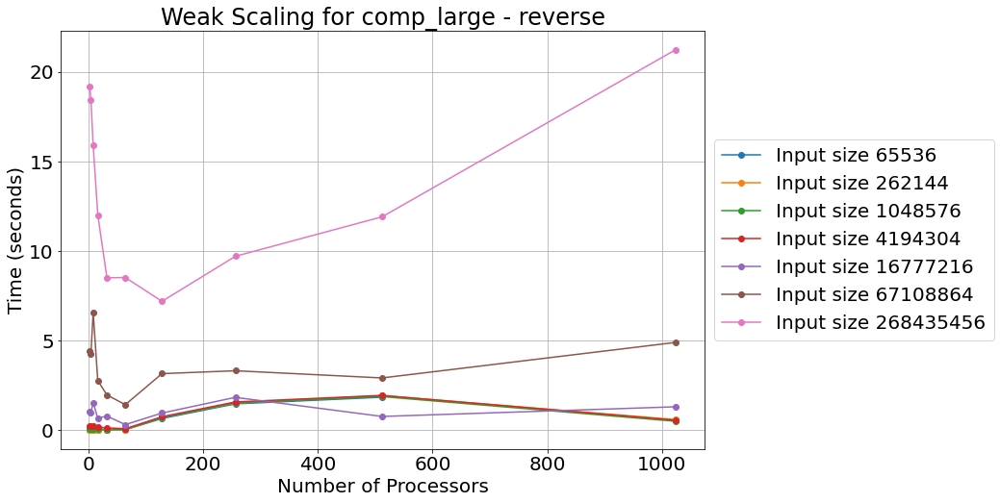

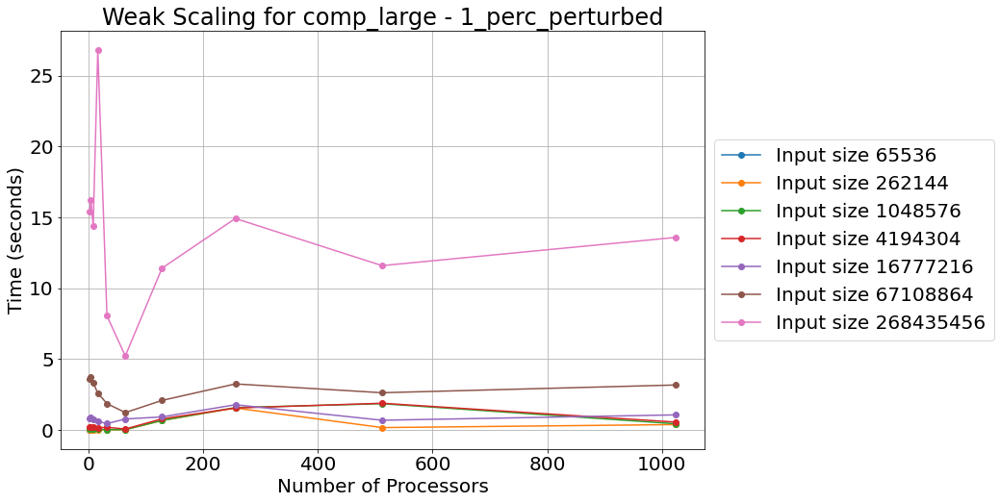

In [42]:
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
count = 0

for node in tk.graph.traverse():
    if (node.frame["name"] == "comp_large"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comp_large'
            )
        ]
        
        count += 1
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.ylabel('Time (seconds)')
            plt.title(f'Weak Scaling for comp_large - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type and input size
                    main_df = wc_df.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')
                    # Plot the average time for the main function for each input size
                    plt.plot(avg_df.index, avg_df['Avg time/rank'], marker='o', label=f'Input size {input_size}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'weak_scaling_comp_large_{input_type}.png', transparent=False, facecolor='white')
            plt.show()

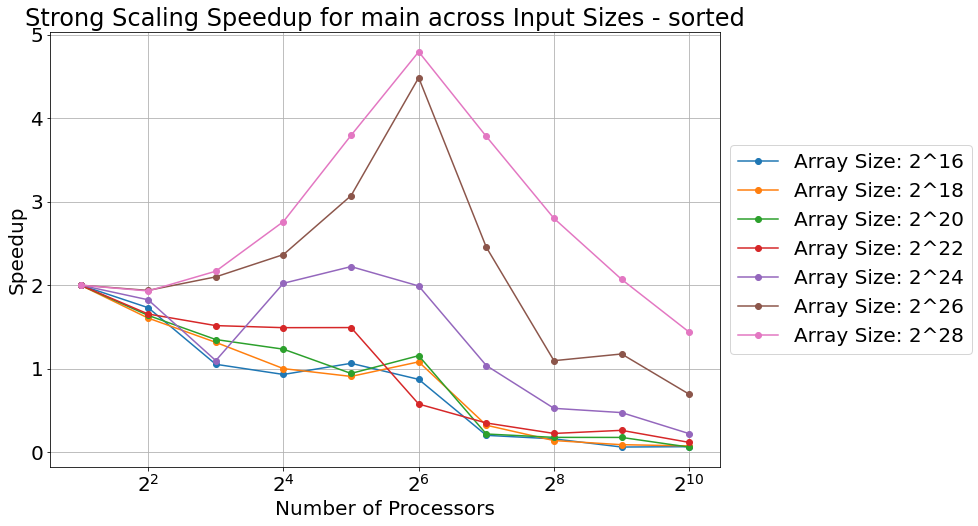

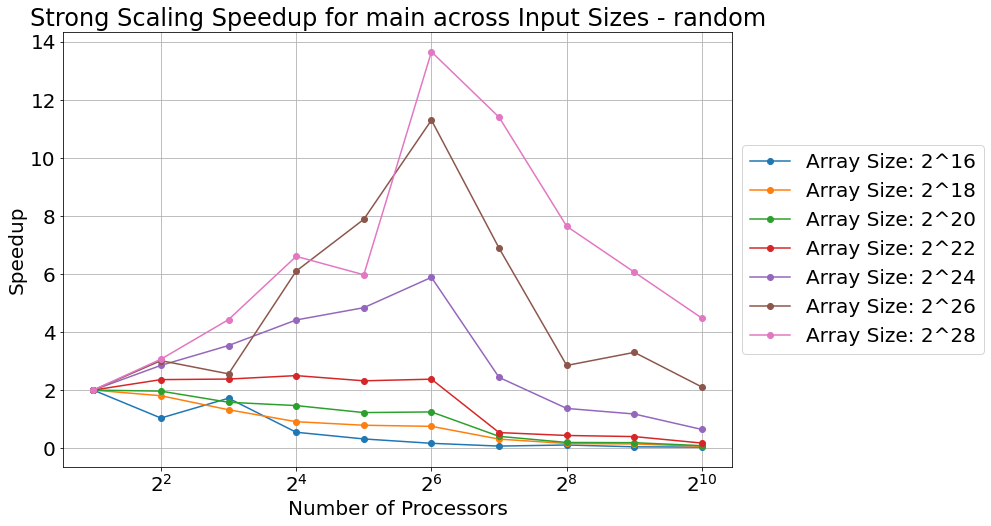

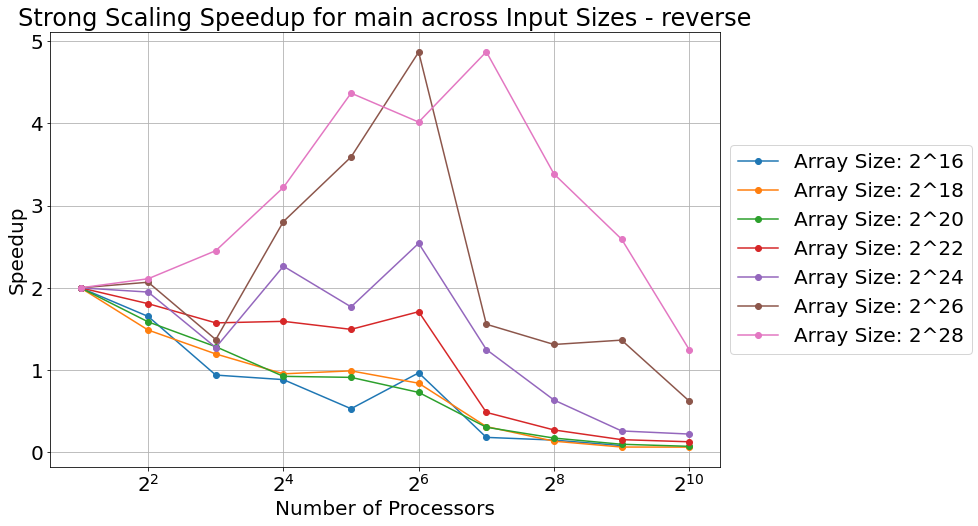

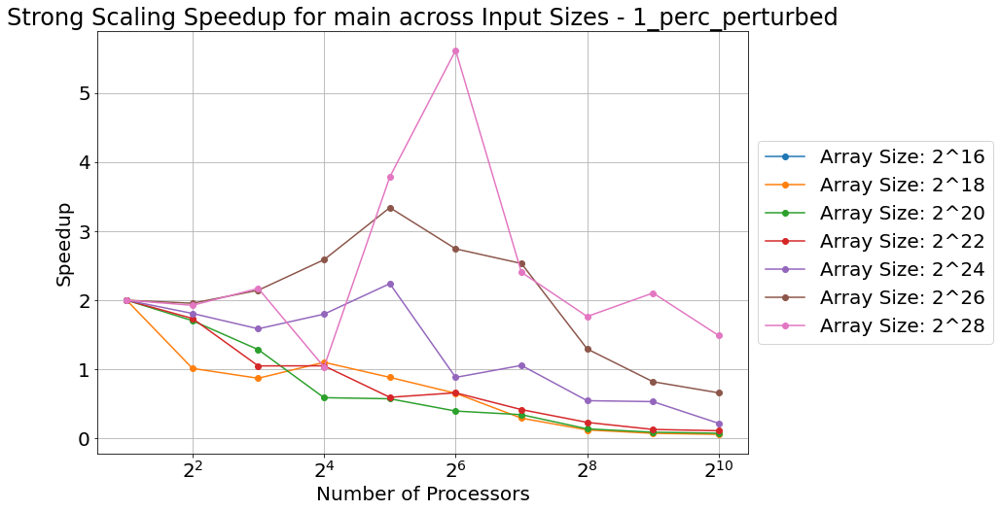

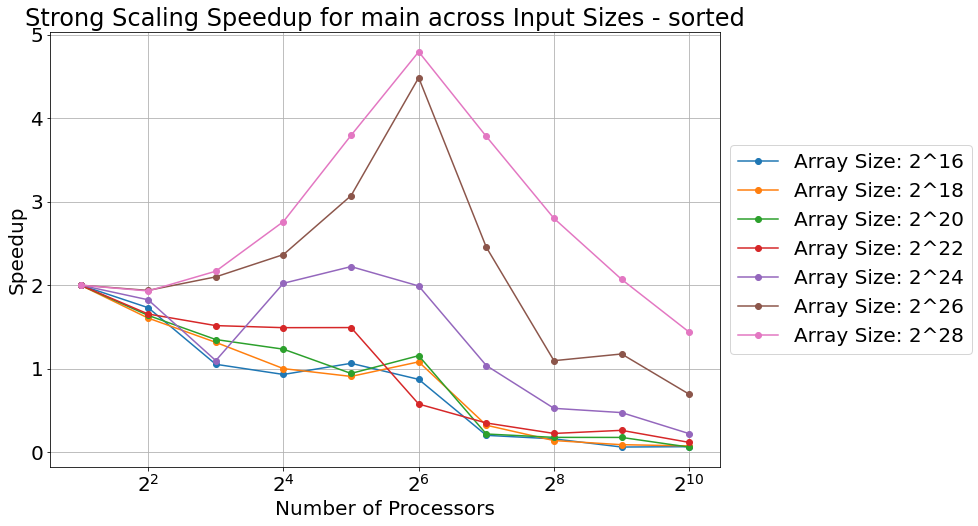

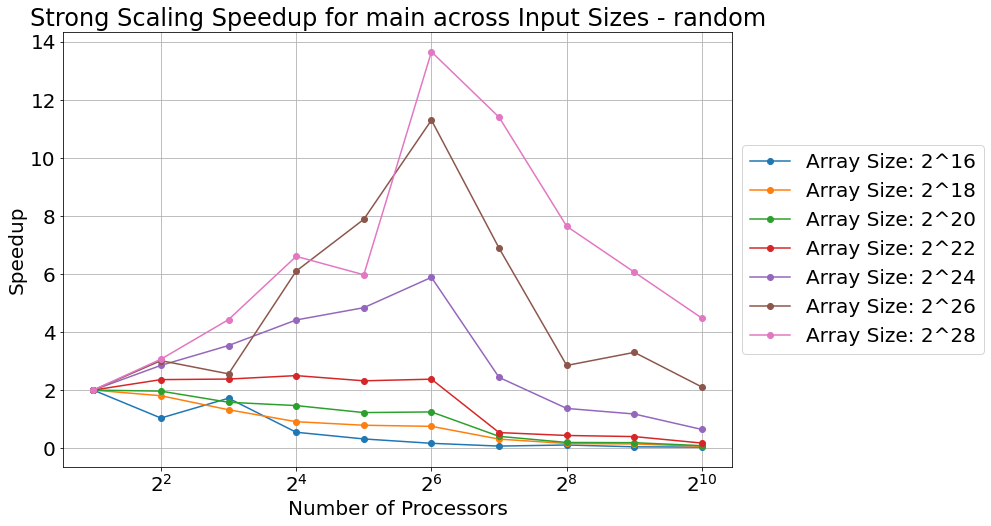

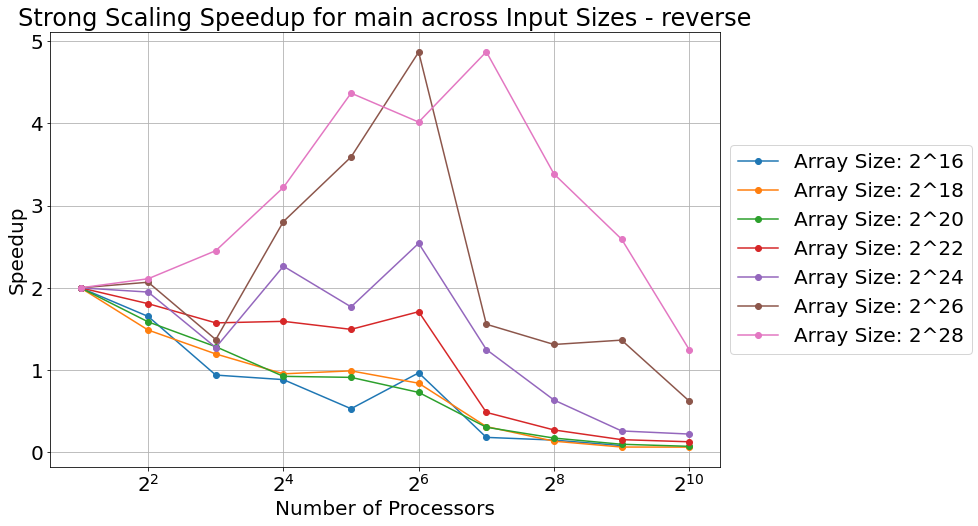

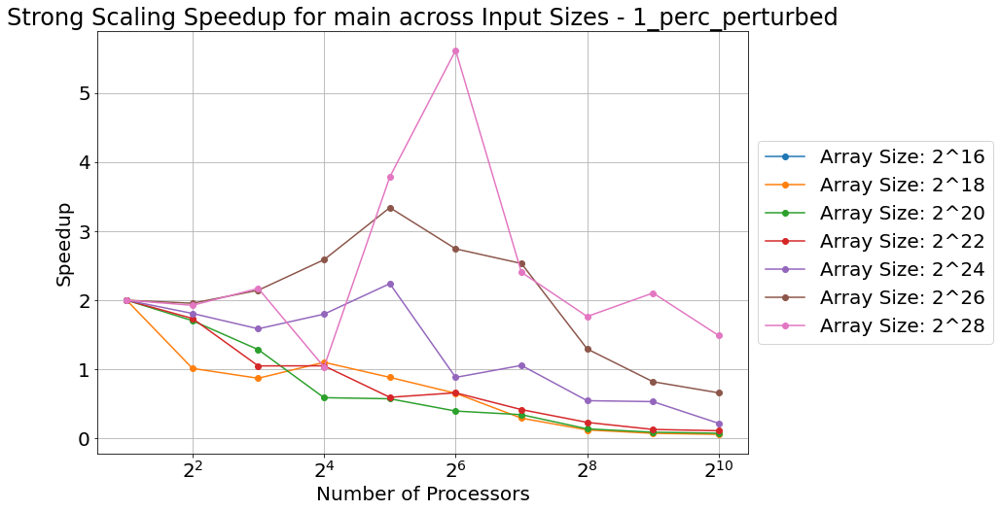

In [43]:
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
for node in tk.graph.traverse():
    if (node.frame["name"] == "main"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'main'
            )
        ]
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.xscale("log", base=2)
            plt.ylabel('Speedup')
            plt.title(f'Strong Scaling Speedup for main across Input Sizes - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type, input size, and main function
                    main_df = tk.dataframe.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                    # Calculate T(1) as T(2) * 2
                    if 2 in avg_df.index:
                        T1 = avg_df.loc[2, 'Avg time/rank'] * 2

                        # Calculate speedup
                        speedup = T1 / avg_df['Avg time/rank']
                        plt.plot(avg_df.index, speedup, marker='o', label=f'Array Size: 2^{int(input_size).bit_length()-1}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'strong_scaling_speedup_main_across_sizes_{input_type}.png', transparent=False, facecolor='white')
            plt.show()

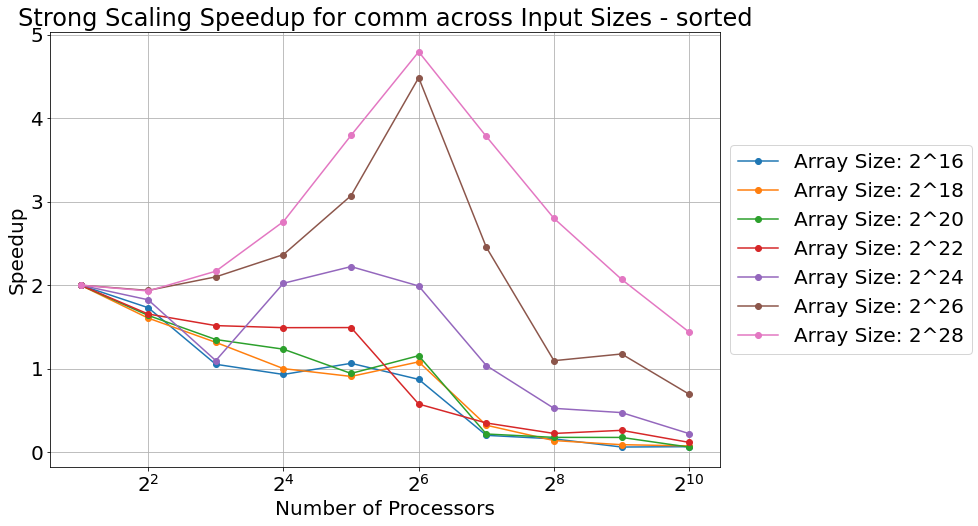

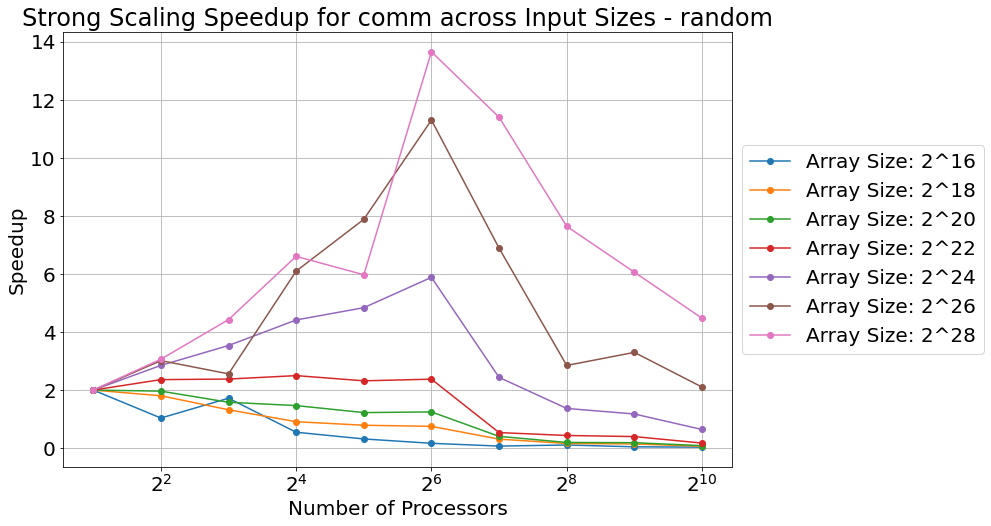

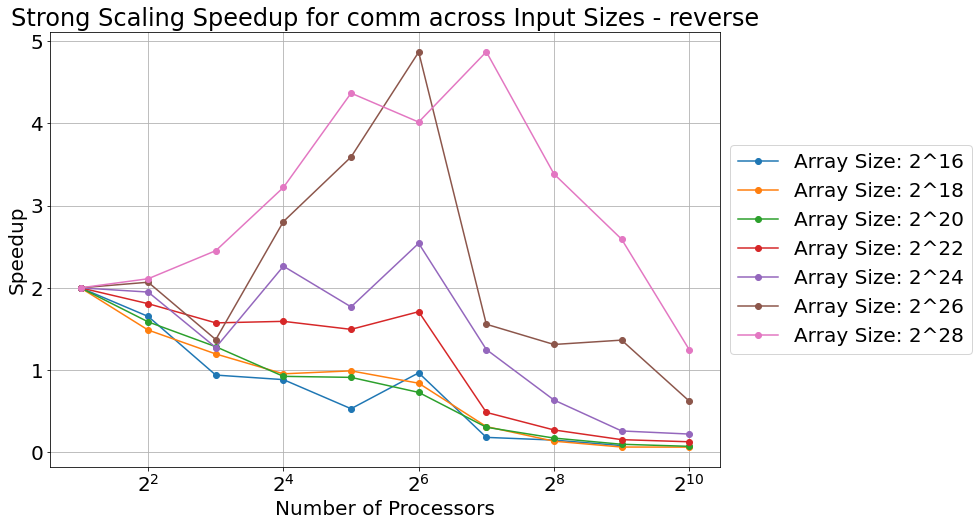

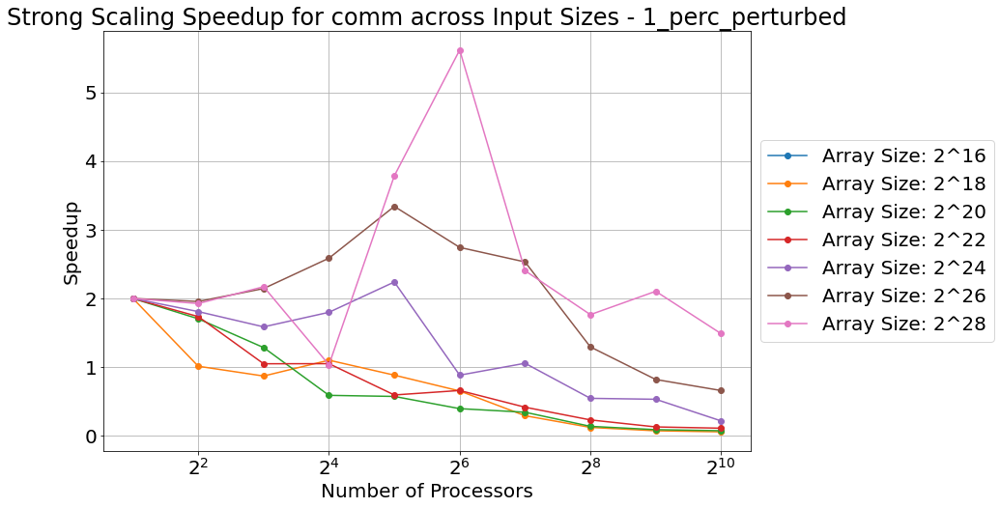

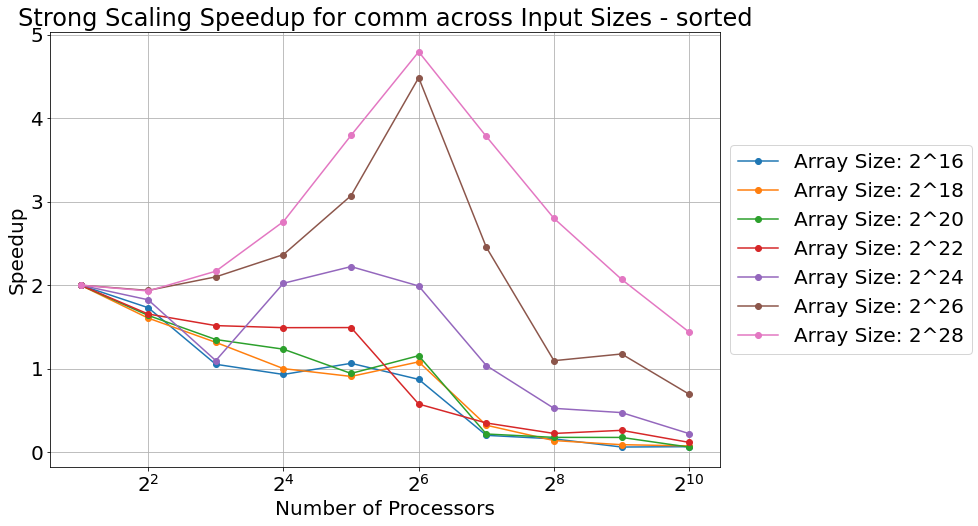

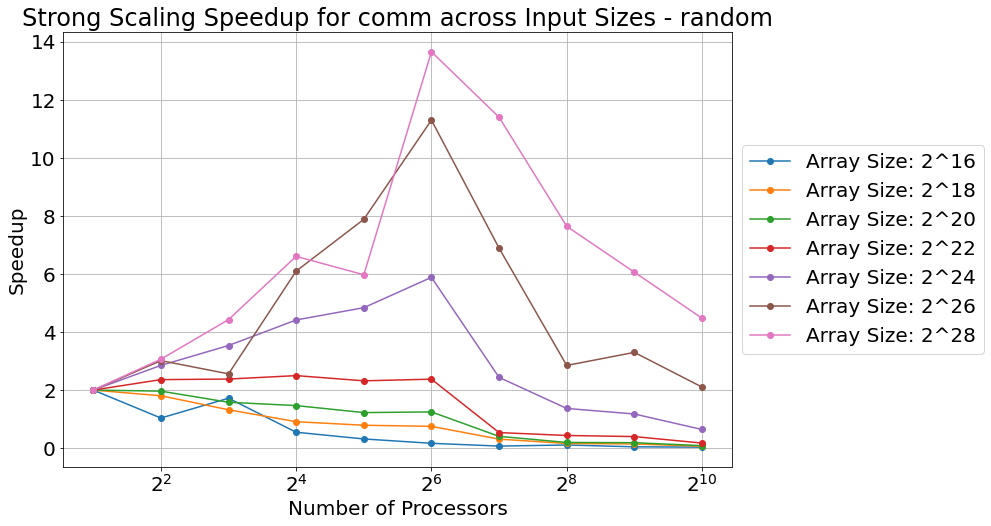

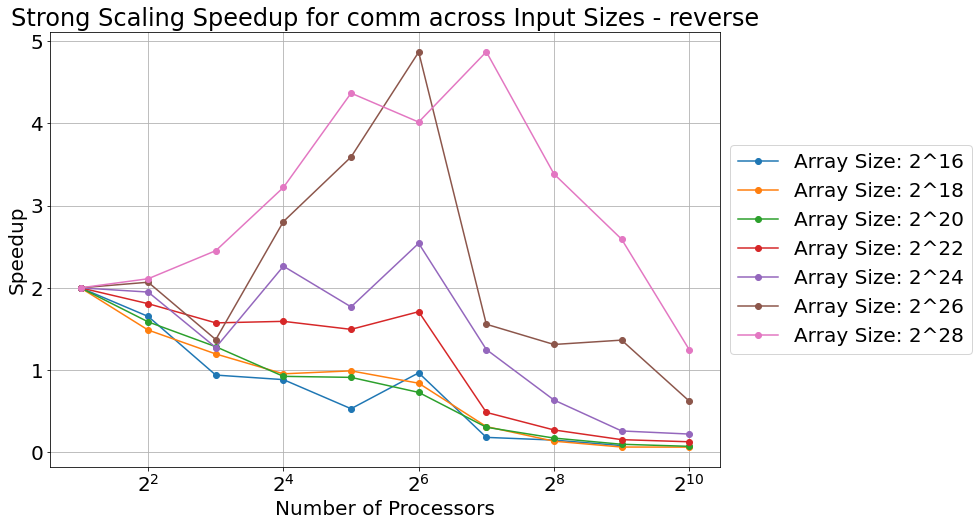

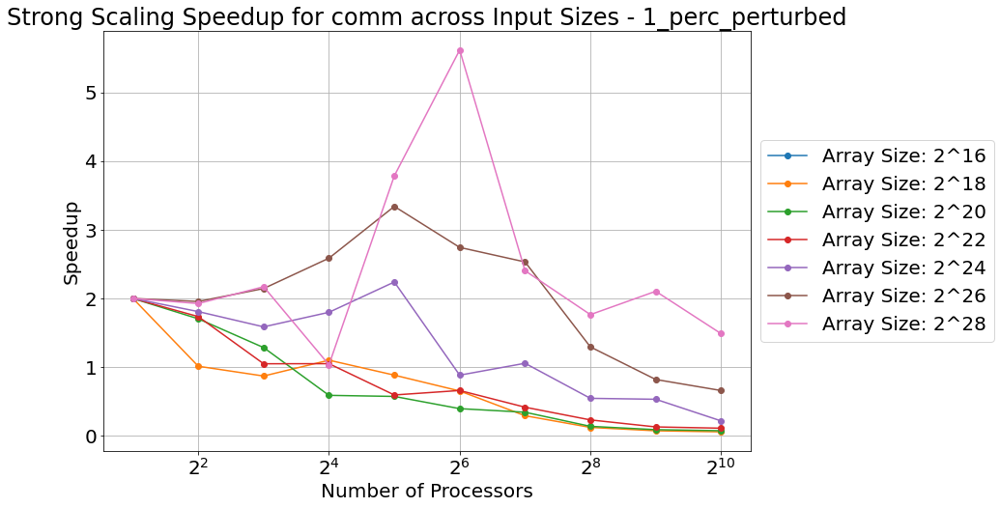

In [44]:
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
for node in tk.graph.traverse():
    if (node.frame["name"] == "comm"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comm'
            )
        ]
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.xscale("log", base=2)
            plt.ylabel('Speedup')
            plt.title(f'Strong Scaling Speedup for comm across Input Sizes - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type, input size, and main function
                    main_df = tk.dataframe.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                    # Calculate T(1) as T(2) * 2
                    if 2 in avg_df.index:
                        T1 = avg_df.loc[2, 'Avg time/rank'] * 2

                        # Calculate speedup
                        speedup = T1 / avg_df['Avg time/rank']
                        plt.plot(avg_df.index, speedup, marker='o', label=f'Array Size: 2^{int(input_size).bit_length()-1}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'strong_scaling_speedup_comm_across_sizes_{input_type}.png', transparent=False, facecolor='white')
            plt.show()

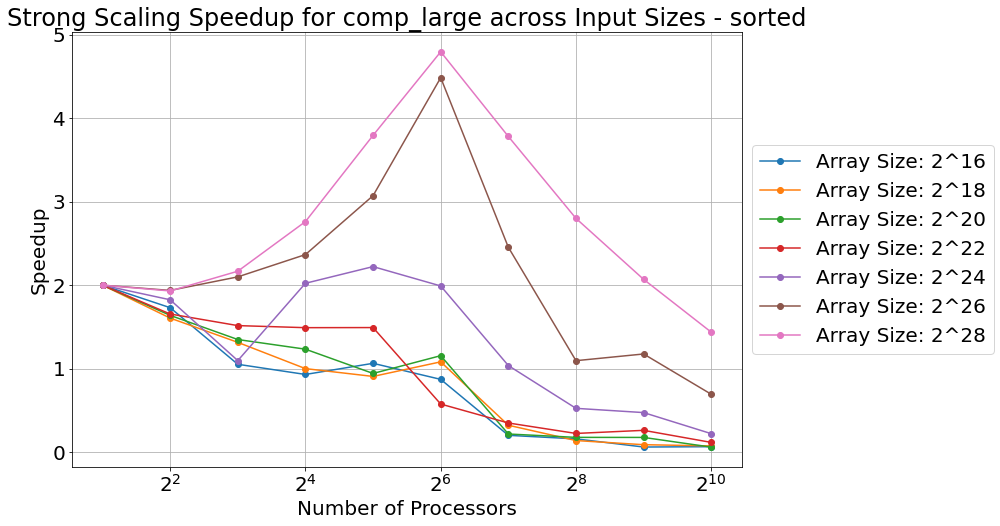

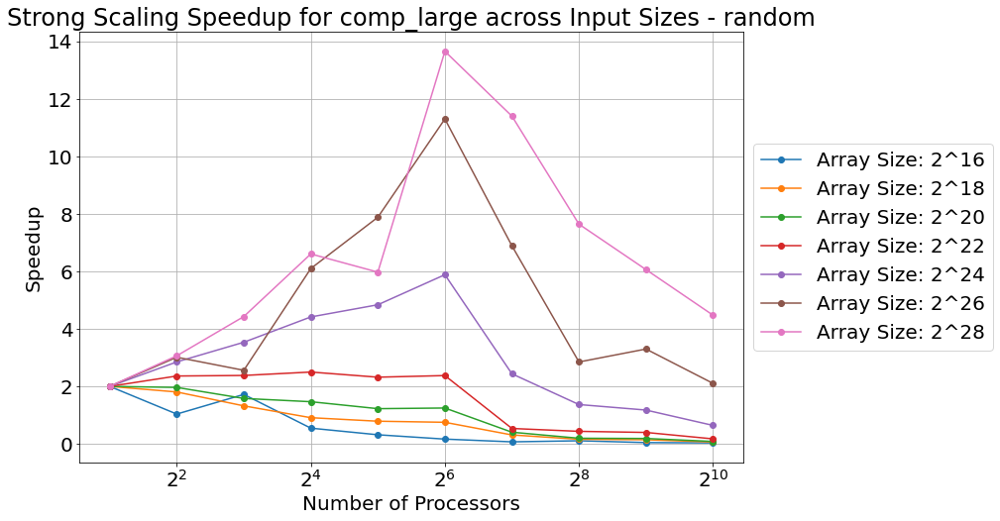

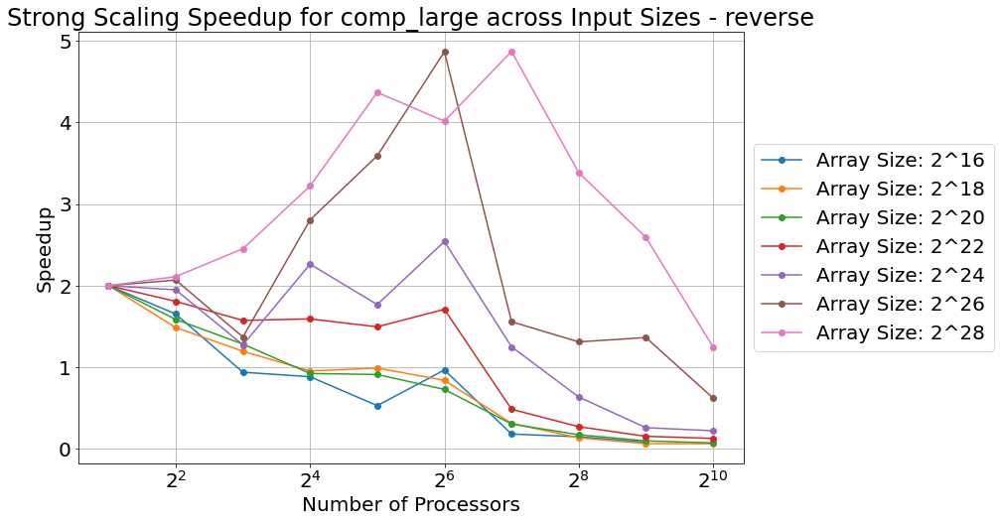

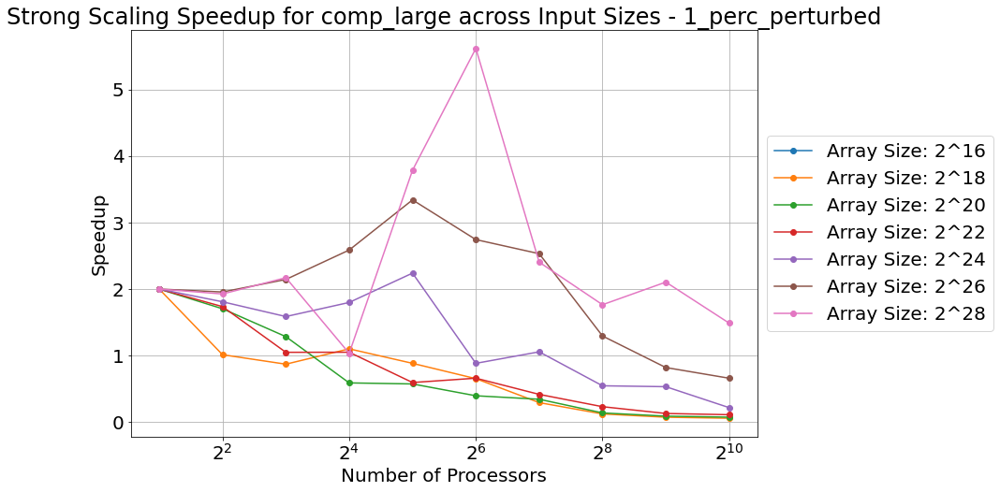

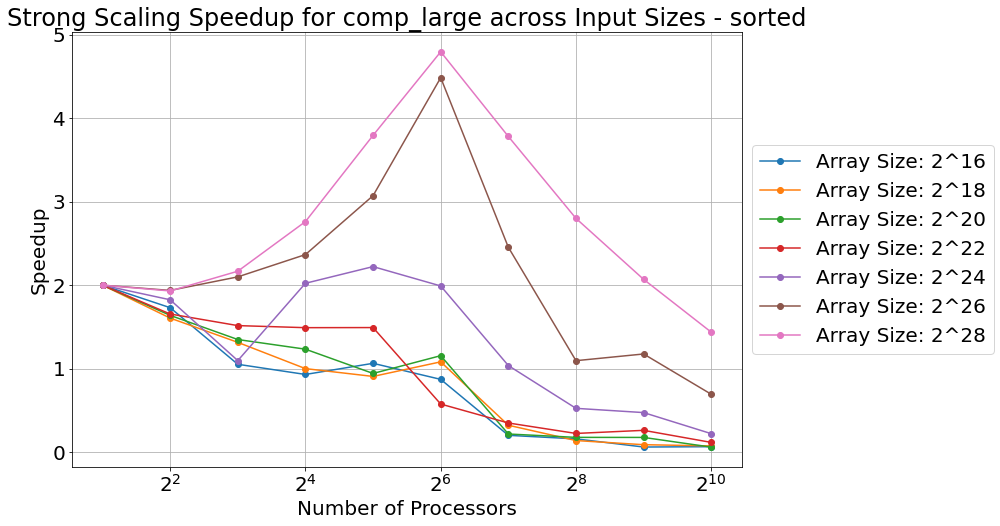

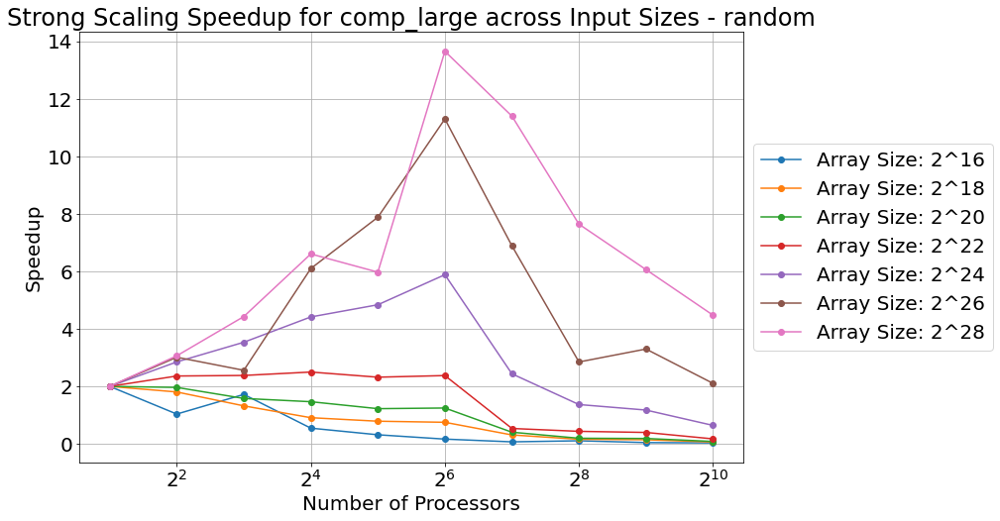

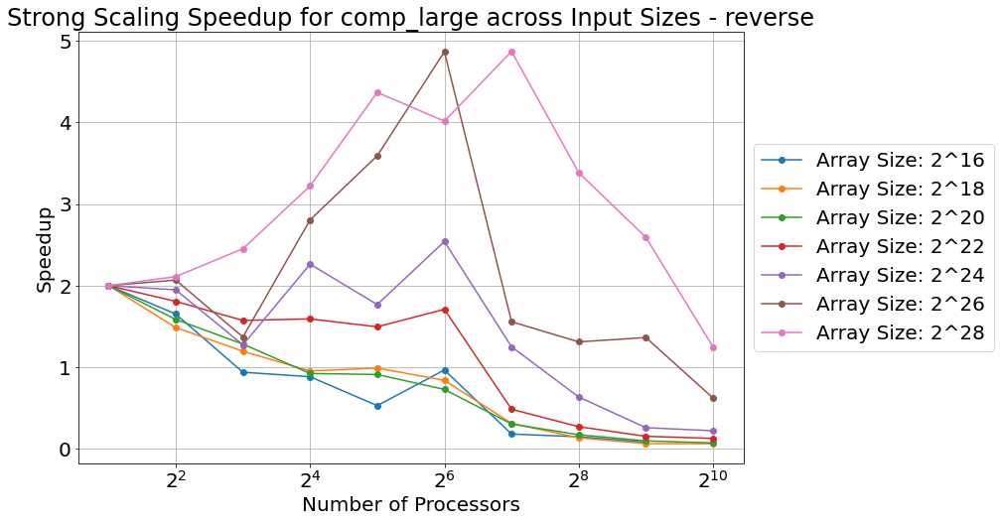

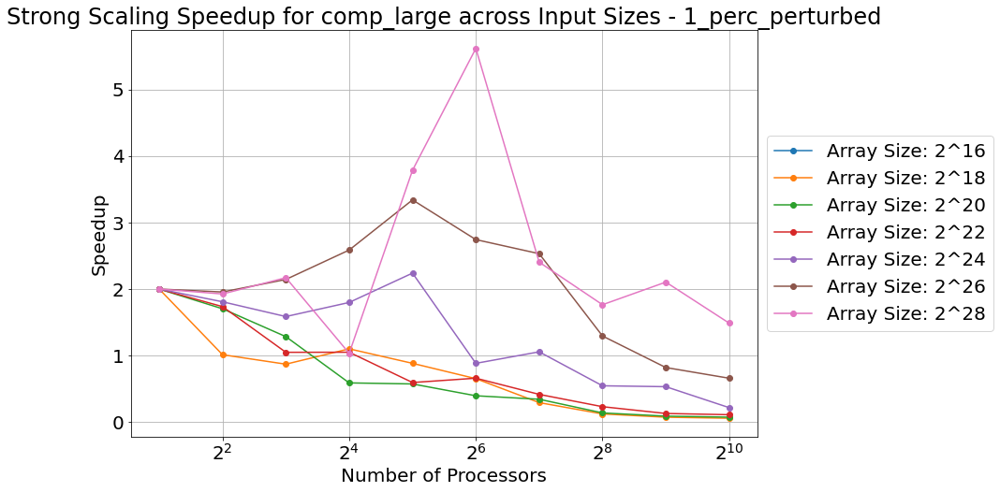

In [45]:
input_types = ['sorted', 'random', 'reverse', '1_perc_perturbed']
input_sizes = [65536, 262144, 1048576, 4194304, 16777216, 67108864, 268435456]
num_procs = [2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]
for node in tk.graph.traverse():
    if (node.frame["name"] == "comp_large"):
        wc_df = tk.dataframe.loc[tk.dataframe.index.get_level_values('node').map(
                lambda x: x.frame["name"] == 'comp_large'
            )
        ]
        
        for input_type in input_types:
            plt.figure(figsize=(12, 8))
            plt.xlabel('Number of Processors')
            plt.xscale("log", base=2)
            plt.ylabel('Speedup')
            plt.title(f'Strong Scaling Speedup for comp_large across Input Sizes - {input_type}')

            for input_size in input_sizes:
                try:
                    # Extract data for the input type, input size, and main function
                    main_df = tk.dataframe.xs(input_size, level='input_size').xs(input_type, level='input_type').reset_index()
                    avg_df = main_df[['num_procs', 'Avg time/rank']].drop_duplicates(subset='num_procs').set_index('num_procs')

                    # Calculate T(1) as T(2) * 2
                    if 2 in avg_df.index:
                        T1 = avg_df.loc[2, 'Avg time/rank'] * 2

                        # Calculate speedup
                        speedup = T1 / avg_df['Avg time/rank']
                        plt.plot(avg_df.index, speedup, marker='o', label=f'Array Size: 2^{int(input_size).bit_length()-1}')

                except KeyError:
                    print(f"Data for input type '{input_type}' and input size '{input_size}' not found.")

            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
            plt.grid(True)
            plt.savefig(f'strong_scaling_speedup_comp_large_across_sizes_{input_type}.png', transparent=False, facecolor='white')
            plt.show()